# <span style="color:red; font-weight:bold">MSE loss for DL models + XGBoost(No quantile)</span>

## <span style="color:orange; font-weight:bold"> Validation stage (train vs val_1)</span>

### Import dataset

In [23]:
import numpy as np
import pandas as pd

df = pd.read_csv("wandb_mse_updated.csv")

# Concatenate the TFT runs
df_TFT = pd.read_csv("TFT_mse.csv", usecols=[c for c in df.columns if c in pd.read_csv("TFT_mse.csv", nrows=0).columns])
# Reindex df2 to ensure it has exactly the same columns/order as df1
df_TFT = df_TFT.reindex(columns=df.columns)
df = pd.concat([df, df_TFT], ignore_index=True)


# === Keep only validation stage runs ===
df_val = df[df['testing_stage'] == False].copy()

### Boxplots of the forecasters

/tmp/ipykernel_36508/2248898928.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='config_name', y=metric, order=order, palette='Set2')
/tmp/ipykernel_36508/2248898928.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='config_name', y=metric, order=order, palette='Set2')
/tmp/ipykernel_36508/2248898928.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='config_name', y=metric, order=order, palette='Set2')
/tmp/ipykernel_36508/2248898928.py:18: FutureWarning: 

Passing `palette` without assigning `hue`

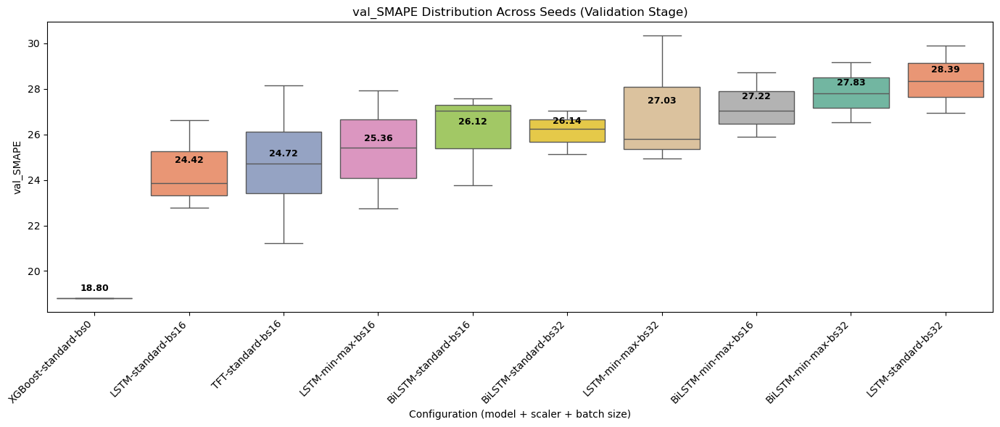

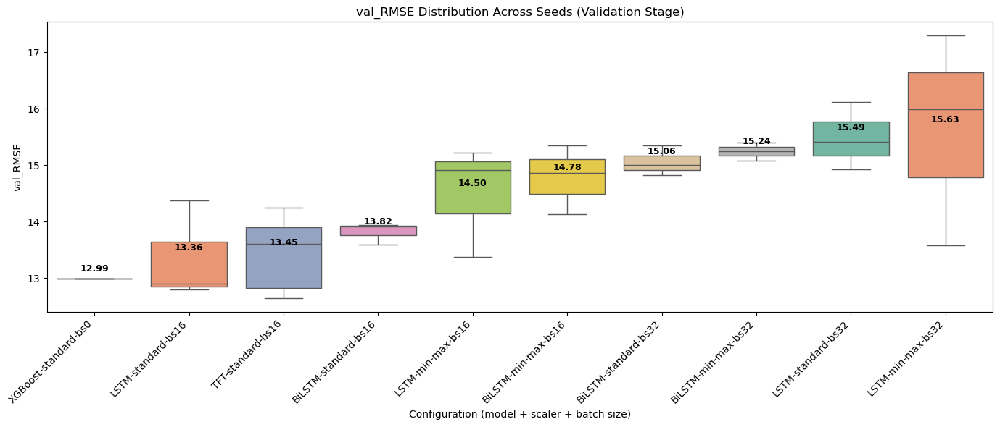

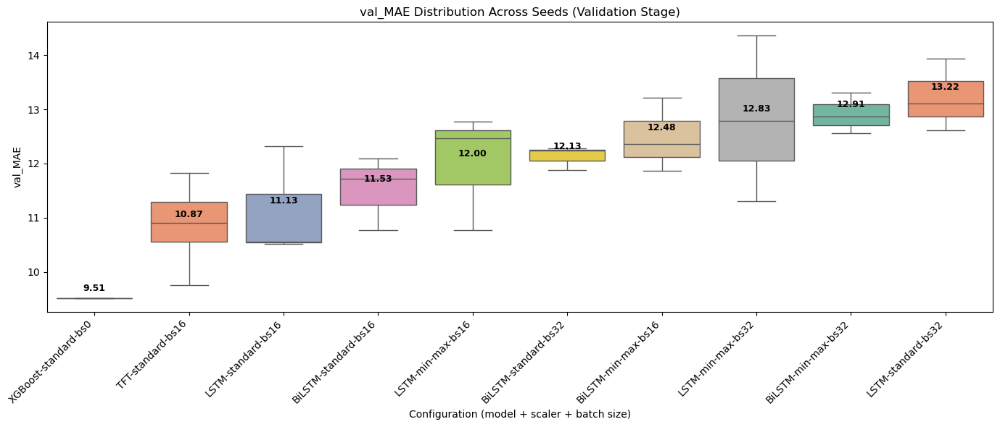

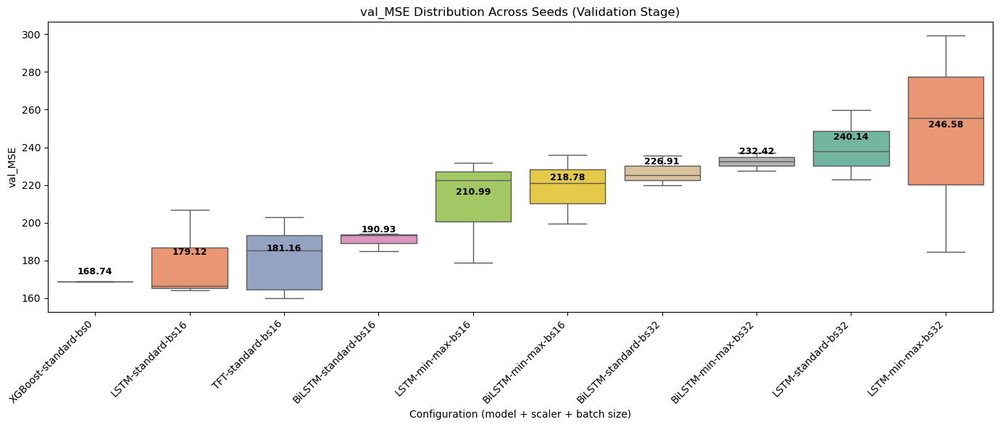

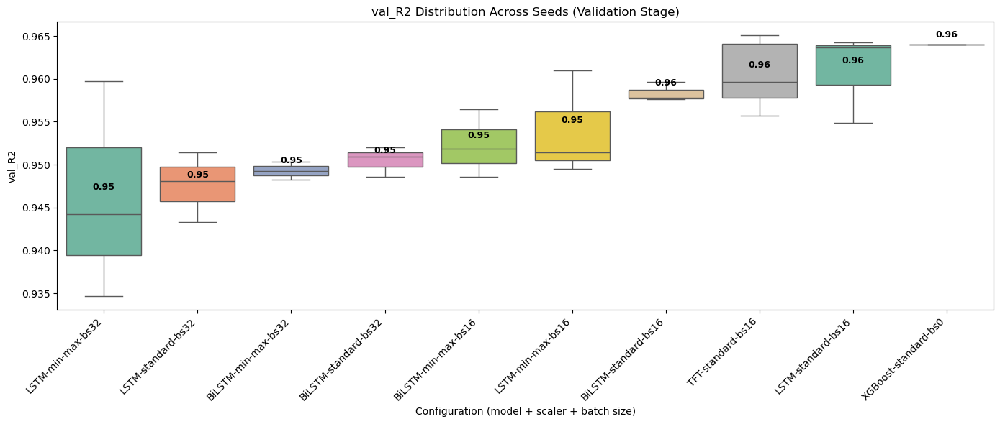

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_boxplots(metric, df):
    # Create config name
    df['config_name'] = (
        df['model_name'] + '-' +
        df['scaler_name'] + '-bs' +
        df['batch_size'].astype(str)
    )

    # Sort configs by mean metric
    order = df.groupby('config_name')[metric].mean().sort_values().index
    mean_vals = df.groupby('config_name')[metric].mean()

    # Plot
    plt.figure(figsize=(14, 6))
    sns.boxplot(data=df, x='config_name', y=metric, order=order, palette='Set2')

    # Annotate means
    y_min = df[metric].min()
    y_max = df[metric].max()
    y_range = y_max - y_min
    offset = 0.02 * y_range

    for i, config in enumerate(order):
        mean_val = mean_vals[config]
        plt.text(i, mean_val + offset, f"{mean_val:.2f}",
                 ha='center', va='bottom', fontsize=9, color='black', fontweight='bold')

    # Adjust y-axis for R2
    if metric.lower() == 'val_r2':
        plt.ylim(y_min - 0.05 * y_range, y_max + 0.05 * y_range)

    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Configuration (model + scaler + batch size)")
    plt.ylabel(f"{metric}")
    plt.title(f"{metric} Distribution Across Seeds (Validation Stage)")
    plt.tight_layout()
    # plt.show()
    plt.savefig(f"Plots/boxplot_{metric}_mse_validation.png")



metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']
for metric in metrics:
    plot_boxplots(metric, df_val)

In [25]:
print("The best configurations (based on SMAPE) are:")
print("1. Model: XGBoost, Scaler: StandardScaler")
print("2. Model: LSTM, Scaler: StandardScaler, Batch Size: 16")
print("3. Model: LSTM, Scaler: Min-Max, Batch Size: 16")
print("4. Model: BiLSTM, Scaler: StandardScaler, Batch Size: 16")
print("5. Model: BiLSTM, Scaler: StandardScaler, Batch Size: 32")
print("6. Model: TFT, Scaler: StandardScaler, Batch Size: 16")

The best configurations (based on SMAPE) are:
1. Model: XGBoost, Scaler: StandardScaler
2. Model: LSTM, Scaler: StandardScaler, Batch Size: 16
3. Model: LSTM, Scaler: Min-Max, Batch Size: 16
4. Model: BiLSTM, Scaler: StandardScaler, Batch Size: 16
5. Model: BiLSTM, Scaler: StandardScaler, Batch Size: 32
6. Model: TFT, Scaler: StandardScaler, Batch Size: 16


### heatmap of metrics vs forecasters

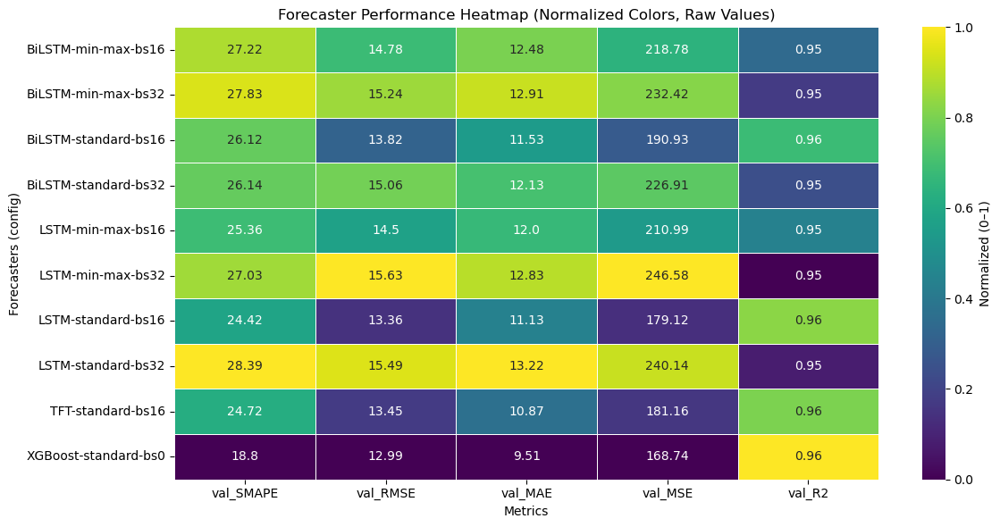

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Create config_name if needed
df_val['config_name'] = df_val['model_name'] + '-' + df_val['scaler_name'] + '-bs' + df_val['batch_size'].astype(str)

# 2. Metrics and average values
metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']
heatmap_data = df_val.groupby('config_name')[metrics].mean()

# 3. Normalize for coloring
normalized = (heatmap_data - heatmap_data.min()) / (heatmap_data.max() - heatmap_data.min())

# 4. Plot heatmap
plt.figure(figsize=(12, len(heatmap_data) * 0.6))
sns.heatmap(
    normalized,
    annot=heatmap_data.round(2),  # show real values
    fmt='',
    cmap='viridis',
    linewidths=0.5,
    cbar_kws={'label': 'Normalized (0–1)'},
)

plt.title("Forecaster Performance Heatmap (Normalized Colors, Raw Values)")
plt.xlabel("Metrics")
plt.ylabel("Forecasters (config)")
plt.tight_layout()
# plt.show()
plt.savefig(f"Plots/heatmap_mse_validation.png")


## <span style="color:blue; font-weight:bold"> Testing stage (train+val_1 vs test)</span>

### Import dataset

In [27]:
import numpy as np
import pandas as pd

df = pd.read_csv("wandb_mse_updated.csv")

# Concatenate the TFT runs
df_TFT = pd.read_csv("TFT_mse.csv", usecols=[c for c in df.columns if c in pd.read_csv("TFT_mse.csv", nrows=0).columns])
# Reindex df2 to ensure it has exactly the same columns/order as df1
df_TFT = df_TFT.reindex(columns=df.columns)
df = pd.concat([df, df_TFT], ignore_index=True)


df_test = df[
    (df['testing_stage'] == True) &         # Only test stage runs
    (df['data_augmentation'] == False)      # Only non-augmented runs
].copy()

### Boxplots of the forecasters

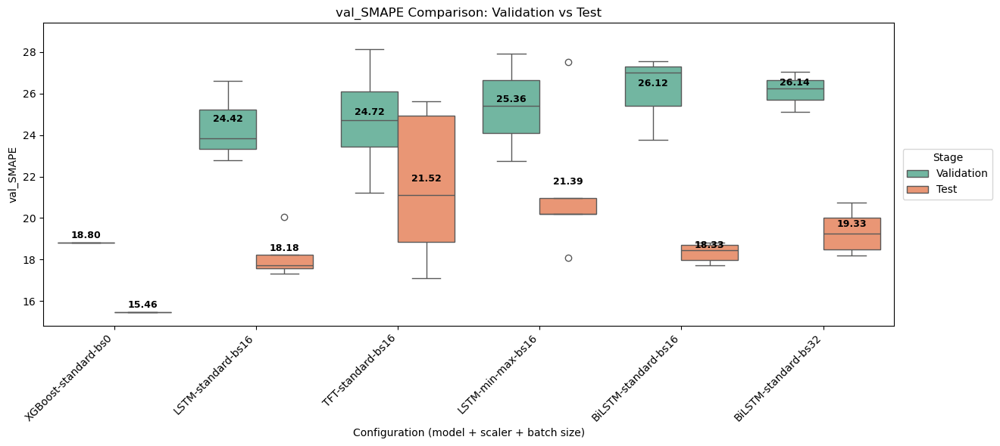

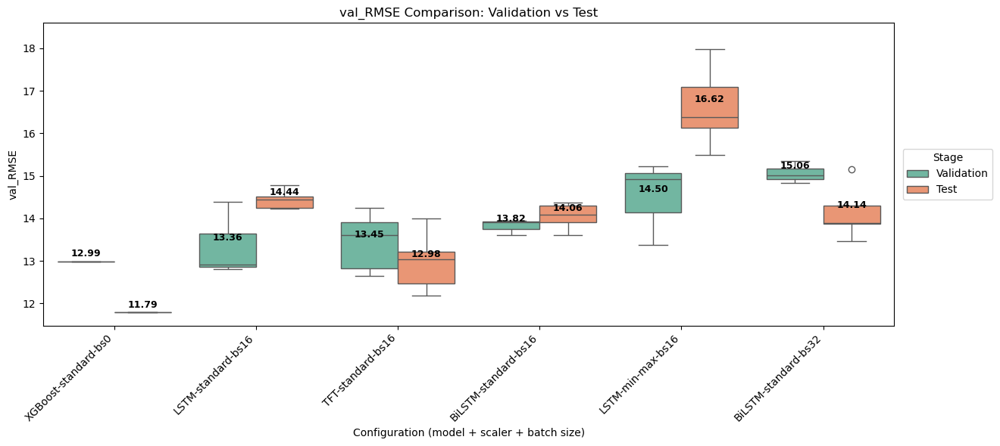

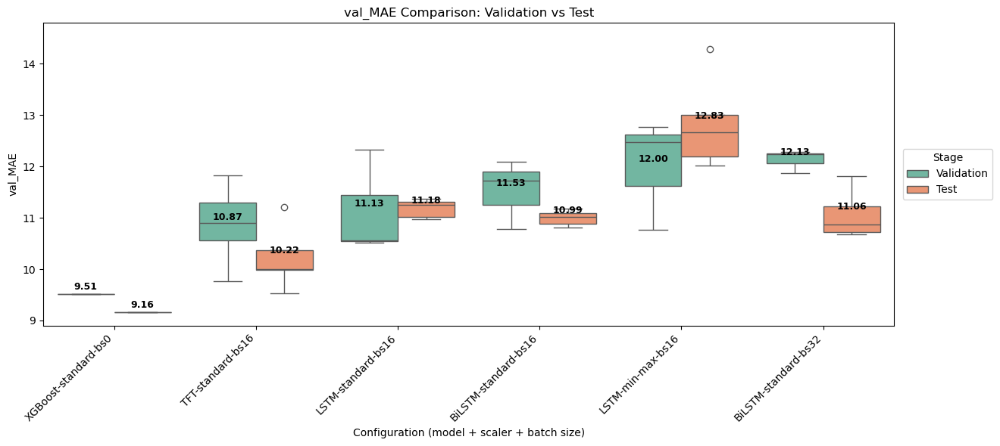

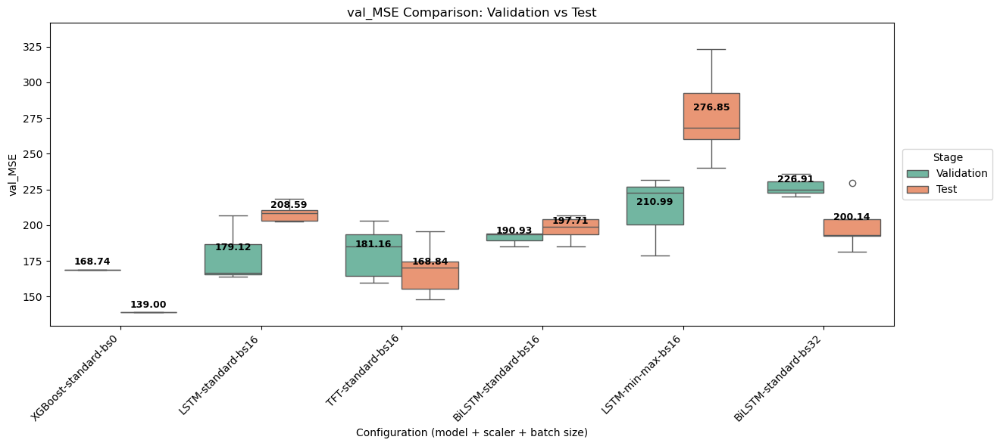

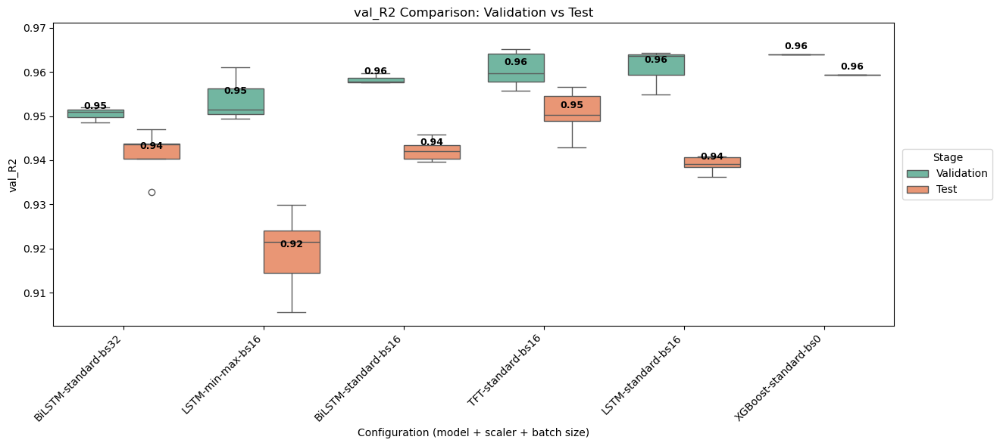

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_comparison_boxplots(metric, df_val_all, df_test_selected):
    # Build config_name
    df_val_all['config_name'] = df_val_all['model_name'] + '-' + df_val_all['scaler_name'] + '-bs' + df_val_all['batch_size'].astype(str)
    df_test_selected['config_name'] = df_test_selected['model_name'] + '-' + df_test_selected['scaler_name'] + '-bs' + df_test_selected['batch_size'].astype(str)

    # Filter for selected configurations
    selected_configs = df_test_selected['config_name'].unique()
    df_val_filtered = df_val_all[df_val_all['config_name'].isin(selected_configs)].copy()
    df_test_selected = df_test_selected.copy()

    # Add stage labels
    df_val_filtered['stage'] = 'Validation'
    df_test_selected['stage'] = 'Test'

    # Combine data
    combined_df = pd.concat([df_val_filtered, df_test_selected], axis=0)

    # Define plot order
    order = df_val_filtered.groupby('config_name')[metric].mean().sort_values().index
    stage_order = ['Validation', 'Test']

    # Compute offset for annotations
    y_min = combined_df[metric].min()
    y_max = combined_df[metric].max()
    y_range = y_max - y_min
    offset = 0.01 * y_range

    # Plot
    plt.figure(figsize=(14, 6))
    sns.boxplot(
        data=combined_df,
        x='config_name',
        y=metric,
        hue='stage',
        order=order,
        hue_order=stage_order,
        palette='Set2'
    )

    # Add annotations
    grouped = combined_df.groupby(['config_name', 'stage'])[metric].mean()
    offsets = {'Validation': -0.2, 'Test': 0.2}

    for i, config in enumerate(order):
        for stage in stage_order:
            if (config, stage) in grouped:
                val = grouped[(config, stage)]
                plt.text(
                    i + offsets[stage], val + offset, f"{val:.2f}",
                    ha='center', va='bottom', fontsize=9,
                    color='black', fontweight='bold'
                )

    # Plot settings
    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Configuration (model + scaler + batch size)")
    plt.ylabel(metric)
    plt.title(f"{metric} Comparison: Validation vs Test")
    plt.ylim(y_min - 0.05 * y_range, y_max + 0.1 * y_range)
    plt.legend(
        title="Stage",
        loc='center left',
        bbox_to_anchor=(1.01, 0.5),
        borderaxespad=0.
    )
    plt.tight_layout(rect=[0, 0, 0.95, 1])
    plt.savefig(f"Plots/boxplot_{metric}_mse_testing.png")
    # plt.show()

# Run for all metrics
metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']
for metric in metrics:
    plot_comparison_boxplots(metric, df_val_all=df_val, df_test_selected=df_test)

### heatmap of metrics vs forecasters

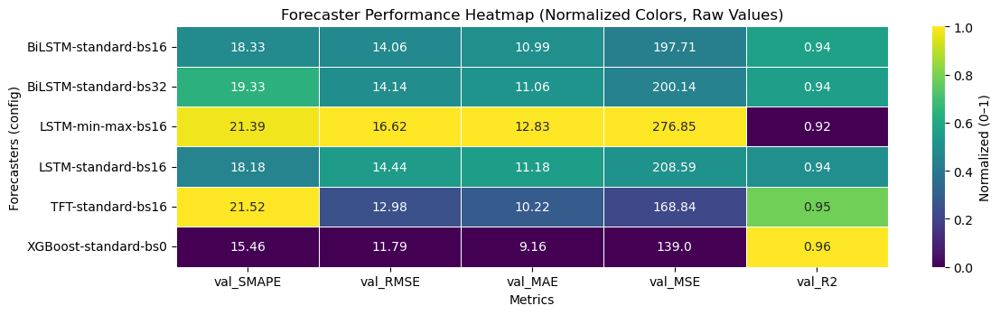

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Create config_name if needed
df_test['config_name'] = df_test['model_name'] + '-' + df_test['scaler_name'] + '-bs' + df_test['batch_size'].astype(str)

# 2. Metrics and average values
metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']
heatmap_data = df_test.groupby('config_name')[metrics].mean()

# 3. Normalize for coloring
normalized = (heatmap_data - heatmap_data.min()) / (heatmap_data.max() - heatmap_data.min())

# 4. Plot heatmap
plt.figure(figsize=(12, len(heatmap_data) * 0.6))
sns.heatmap(
    normalized,
    annot=heatmap_data.round(2),  # show real values
    fmt='',
    cmap='viridis',
    linewidths=0.5,
    cbar_kws={'label': 'Normalized (0–1)'},
)

plt.title("Forecaster Performance Heatmap (Normalized Colors, Raw Values)")
plt.xlabel("Metrics")
plt.ylabel("Forecasters (config)")
plt.tight_layout()
# plt.show()
plt.savefig(f"Plots/heatmap_mse_testing.png")


## <span style="color:green; font-weight:bold"> Data Augmentation stage</span>

### Import dataset

In [30]:
import pandas as pd

df = pd.read_csv("wandb_mse_updated.csv")

# Concatenate the TFT runs
df_TFT = pd.read_csv("TFT_mse.csv", usecols=[c for c in df.columns if c in pd.read_csv("TFT_mse.csv", nrows=0).columns])
# Reindex df2 to ensure it has exactly the same columns/order as df1
df_TFT = df_TFT.reindex(columns=df.columns)
df = pd.concat([df, df_TFT], ignore_index=True)

df_aug = df[
    (df['testing_stage'] == True) &         # Only test stage runs
    (df['data_augmentation'] == True)       # Only augmented runs
].copy()

### Compute Lift metric plots

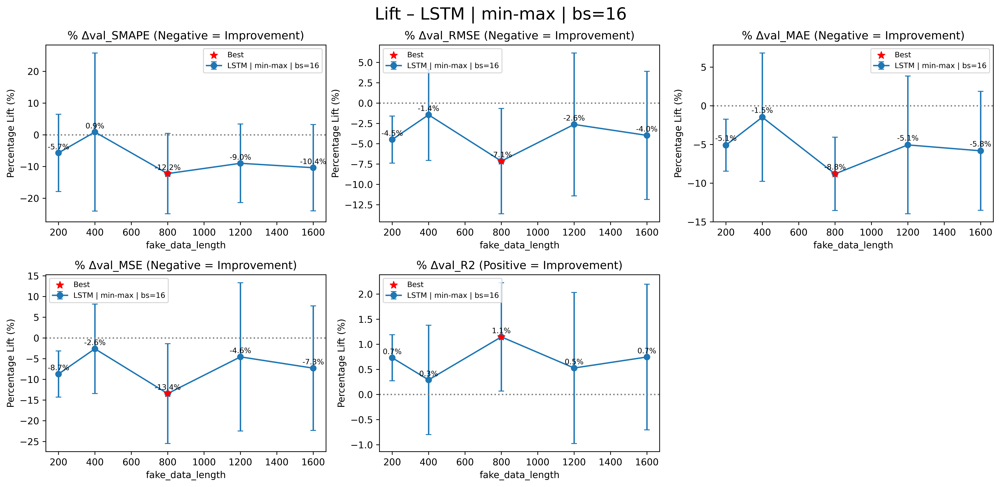

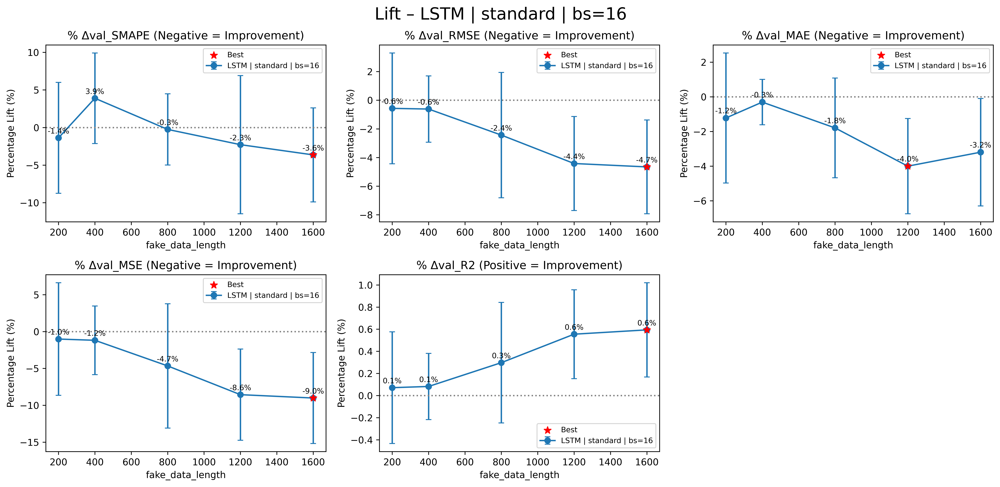

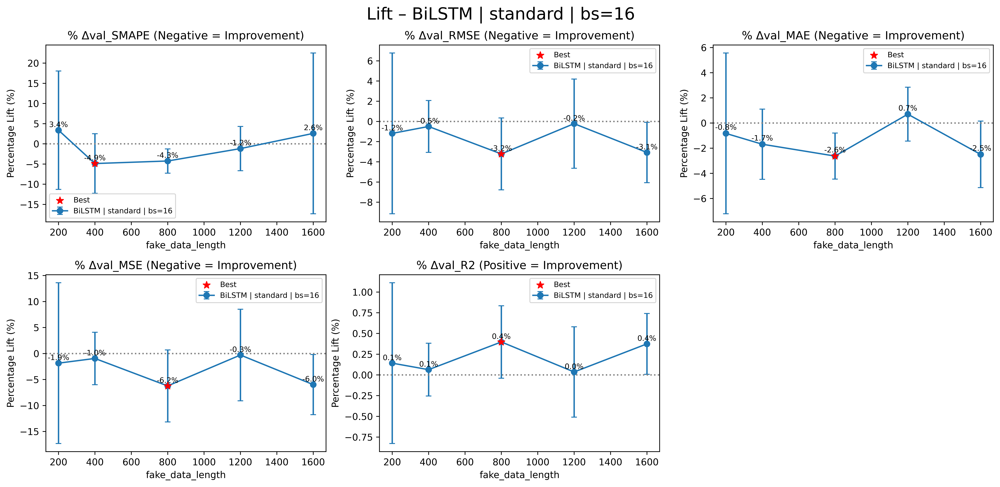

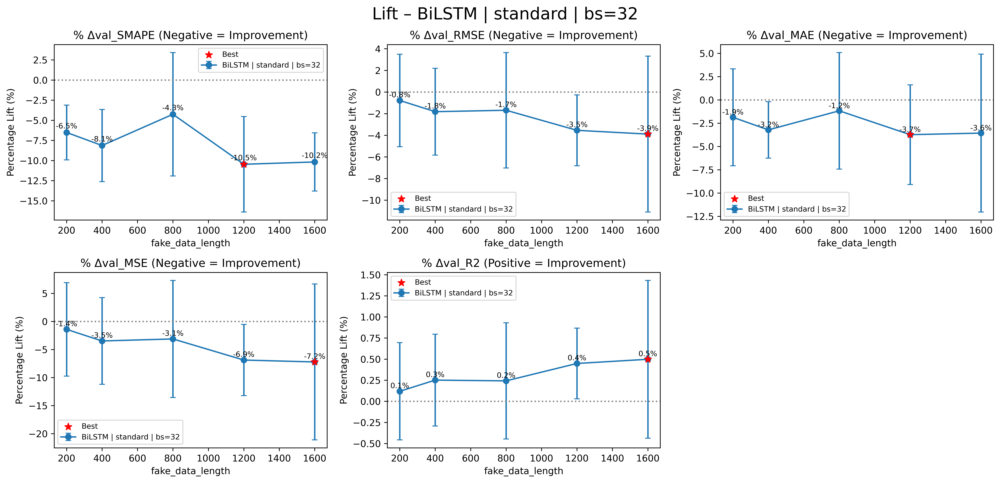

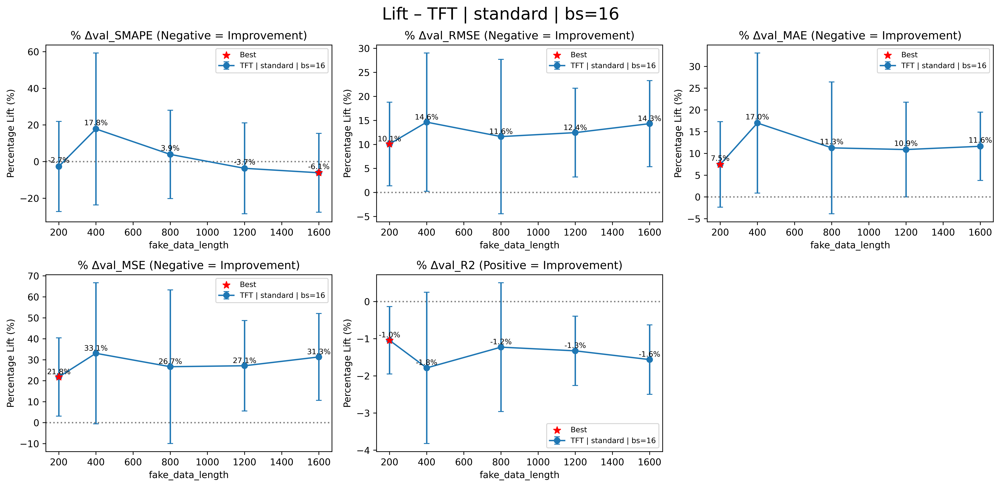

True

In [31]:
import matplotlib.pyplot as plt
import pandas as pd
import os

def plot_metrics_per_model_and_batch(metrics, df_aug, df_all, nrows=2, ncols=3, dpi=300, save_dir=None):
    grouped_models = df_aug[['model_name', 'scaler_name', 'batch_size']].drop_duplicates()

    for _, row in grouped_models.iterrows():
        model = row['model_name']
        scaler = row['scaler_name']
        batch_size = row['batch_size']

        fig, axes = plt.subplots(
            nrows=nrows,
            ncols=ncols,
            figsize=(5 * ncols, 3.5 * nrows),
            dpi=dpi,
            sharex=False,
            sharey=False
        )
        axes = axes.flatten()

        for idx, metric in enumerate(metrics):
            if idx >= len(axes):
                break

            ax = axes[idx]

            # Filter all relevant runs
            df_filtered = df_all[
                (df_all['model_name'] == model) &
                (df_all['scaler_name'] == scaler) &
                (df_all['batch_size'] == batch_size) &
                (df_all['testing_stage'] == True)
            ]

            # Baseline (no augmentation)
            no_aug = (
                df_filtered[df_filtered['data_augmentation'] == False]
                .set_index(['scaler_name', 'seed'])[metric]
                .rename(f'{metric}_no_aug')
            )

            # Augmented
            aug_df = (
                df_filtered[df_filtered['data_augmentation'] == True]
                .set_index(['scaler_name', 'seed'])
                .join(no_aug, how='left')
                .reset_index()
            )

            # Compute lift
            delta_col = f'{metric}_lift'
            aug_df[delta_col] = (
                (aug_df[metric] - aug_df[f'{metric}_no_aug']) / aug_df[f'{metric}_no_aug']
            ) * 100

            # Aggregate
            stats = (
                aug_df
                .groupby('fake_data_length')[delta_col]
                .agg(['mean', 'std'])
                .reset_index()
            )

            # Plot error bars
            ax.errorbar(
                stats['fake_data_length'],
                stats['mean'],
                yerr=stats['std'],
                marker='o',
                capsize=3,
                label=f'{model} | {scaler} | bs={batch_size}'
            )

            # ⬇️ Add percentage lift text labels
            for x, y in zip(stats['fake_data_length'], stats['mean']):
                y_offset = (stats['mean'].max() - stats['mean'].min()) * 0.05  # 5% of y-range
                ax.text(x, y + y_offset, f"{y:.1f}%", ha='center', va='bottom', fontsize=8)

            # ✅ Highlight best lift point
            if not stats.empty:
                if 'R2' in metric:
                    best_idx = stats['mean'].idxmax()  # higher is better
                else:
                    best_idx = stats['mean'].idxmin()  # lower is better
                x_best = stats.loc[best_idx, 'fake_data_length']
                y_best = stats.loc[best_idx, 'mean']
                ax.scatter(x_best, y_best, color='red', s=60, marker='*', zorder=5, label='Best')

            ax.axhline(0, linestyle=':', color='gray')

            # Titles and labels
            if metric.lower() == 'val_r2':
                ax.set_title(f"% Δ{metric} (Positive = Improvement)")
            else:
                ax.set_title(f"% Δ{metric} (Negative = Improvement)")
            ax.set_xlabel("fake_data_length")
            ax.set_ylabel("Percentage Lift (%)")
            ax.legend(fontsize=8)

        # Turn off unused axes
        for idx in range(len(metrics), len(axes)):
            axes[idx].axis("off")

        plt.tight_layout()
        plt.suptitle(f"Lift – {model} | {scaler} | bs={batch_size}", y=1.03, fontsize=18)

        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            save_path = os.path.join(save_dir, f"lift_{model}_{scaler}_bs{batch_size}.png")
            plt.savefig(save_path, dpi=dpi, bbox_inches='tight')

        plt.show()

import pandas as pd
import numpy as np
import os

ERROR_METRICS = {"SMAPE", "RMSE", "MAE", "MSE", "Pinball", "Sharpness"}  # lower is better
GOOD_METRICS  = {"R2"}  # higher is better

def _is_good_metric(metric_name: str) -> bool:
    # crude but robust: check if any good metric token is inside the metric name (case-insensitive)
    name = metric_name.upper()
    return any(tok in name for tok in GOOD_METRICS)

def compute_lift_stats_for_group(df_all, model, scaler, batch_size, metrics):
    """Returns dict(metric -> stats_df with columns: fake_data_length, mean, std)"""
    out = {}
    df_filtered = df_all[
        (df_all['model_name'] == model) &
        (df_all['scaler_name'] == scaler) &
        (df_all['batch_size'] == batch_size) &
        (df_all['testing_stage'] == True)
    ].copy()

    # Build baseline per seed
    base = (
        df_filtered[df_filtered['data_augmentation'] == False]
        .set_index(['seed'])
    )

    # All augmented rows joined with baseline per seed
    aug = (
        df_filtered[df_filtered['data_augmentation'] == True]
        .set_index(['seed'])
        .join(base[[m for m in metrics]], rsuffix='_no_aug', how='left')
        .reset_index()
    )

    for metric in metrics:
        lift = ((aug[metric] - aug[f"{metric}_no_aug"]) / aug[f"{metric}_no_aug"]) * 100
        tmp = aug[['fake_data_length']].copy()
        tmp['lift'] = lift
        stats = tmp.groupby('fake_data_length')['lift'].agg(['mean', 'std']).reset_index()
        out[metric] = stats
    return out

def format_mean_std(mean, std, decimals=1):
    if pd.isna(mean):
        return ""
    if pd.isna(std) or std == 0:
        return f"{mean:.{decimals}f}\\%"
    return f"{mean:.{decimals}f}±{std:.{decimals}f}\\%"

def build_lift_table_for_group(df_all, model, scaler, batch_size, metrics, decimals=1):
    """Returns (wide_df, best_rows_df) where wide_df has one row per metric and columns per fake_data_length (+ Best columns)."""
    stats_dict = compute_lift_stats_for_group(df_all, model, scaler, batch_size, metrics)

    # Collect all augmentation sizes to define consistent column order
    all_lengths = sorted(set().union(*[set(s['fake_data_length']) for s in stats_dict.values()]))

    rows = []
    best_rows = []
    for metric in metrics:
        stats = stats_dict[metric]
        # map for quick lookup
        m = {int(r['fake_data_length']): (r['mean'], r['std']) for _, r in stats.iterrows()}
        # find best index (min for errors, max for goodness)
        is_good = _is_good_metric(metric)
        if not stats.empty:
            best_idx = stats['mean'].idxmax() if is_good else stats['mean'].idxmin()
            best_len = int(stats.loc[best_idx, 'fake_data_length'])
            best_mean = float(stats.loc[best_idx, 'mean'])
        else:
            best_len, best_mean = (np.nan, np.nan)

        row = {"Metric": metric}
        for L in all_lengths:
            mean, std = m.get(L, (np.nan, np.nan))
            row[f"{L}"] = format_mean_std(mean, std, decimals)

        # Best columns
        direction = "↑" if is_good else "↓"
        row["Best (lift)"] = f"{best_mean:.{decimals}f}\\% {direction}" if pd.notna(best_mean) else ""
        row["Best n"] = f"{best_len}" if pd.notna(best_len) else ""
        rows.append(row)

        best_rows.append({
            "Metric": metric,
            "Best_n": best_len,
            "Best_lift_mean_%": best_mean
        })

    wide_df = pd.DataFrame(rows)
    best_rows_df = pd.DataFrame(best_rows)
    # Order columns nicely
    wide_df = wide_df[["Metric"] + [str(L) for L in all_lengths] + ["Best (lift)", "Best n"]]
    return wide_df, best_rows_df

def tables_to_latex(
    df_all,
    df_aug,  # only used to enumerate groups
    metrics,
    save_dir="latex_tables",
    decimals=1,
    combine_all=False,
    table_caption_tpl="Lift (Δ%) vs. baseline across synthetic lengths for {model} | {scaler} | bs={bs}. Negative is better for error metrics; positive is better for R².",
    table_label_tpl="tab:lift_{model}_{scaler}_bs{bs}",
    use_booktabs=True
):
    os.makedirs(save_dir, exist_ok=True)
    grouped = df_aug[['model_name', 'scaler_name', 'batch_size']].drop_duplicates()

    combined_tables = []

    for _, row in grouped.iterrows():
        model = row['model_name']
        scaler = row['scaler_name']
        bs = row['batch_size']

        table_df, _ = build_lift_table_for_group(df_all, model, scaler, bs, metrics, decimals=decimals)

        # Escape underscores etc. for LaTeX in the *data*, not in the caption/label
        table_tex = table_df.to_latex(
            index=False,
            escape=True,
            column_format="l" + "c"*(table_df.shape[1]-1),
            longtable=False,
            bold_rows=False,
            na_rep="",
            caption=table_caption_tpl.format(model=model, scaler=scaler, bs=bs),
            label=table_label_tpl.format(model=str(model).replace(' ',''), scaler=str(scaler).replace(' ',''), bs=bs),
            multicolumn=True,
            multicolumn_format='c',
            buf=None
        )

        if use_booktabs:
            table_tex = table_tex.replace("\\toprule", "\\toprule").replace("\\midrule", "\\midrule").replace("\\bottomrule", "\\bottomrule")
        # Save per-group tex
        fname = os.path.join(save_dir, f"lift_{model}_{scaler}_bs{bs}.tex").replace(" ", "")
        with open(fname, "w", encoding="utf-8") as f:
            f.write(table_tex)

        if combine_all:
            # carry an identifying header row (not LaTeX header) for concatenated CSV feel
            tmp = table_df.copy()
            tmp.insert(0, "Model", model)
            tmp.insert(1, "Scaler", scaler)
            tmp.insert(2, "Batch", bs)
            combined_tables.append(tmp)

    if combine_all and combined_tables:
        big = pd.concat(combined_tables, ignore_index=True)
        big_tex = big.to_latex(
            index=False,
            escape=True,
            column_format="l"*3 + "c"*(big.shape[1]-3),
            caption="Lift (Δ%) across all model/scaler/batch configurations.",
            label="tab:lift_all",
        )
        with open(os.path.join(save_dir, "lift_all.tex"), "w", encoding="utf-8") as f:
            f.write(big_tex)
    return True


# Run the lift plots
metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']
plot_metrics_per_model_and_batch(metrics, df_aug=df_aug, df_all=df, save_dir="lift_plots", dpi=600)
tables_to_latex(
    df_all=df,         # your full dataframe
    df_aug=df_aug,     # used only to enumerate model/scaler/bs groups
    metrics=metrics,
    save_dir="latex_tables",
    decimals=1,
    combine_all=True   # also emit a single grand table
)

### heatmap of metrics vs forecasters (With Augmentation)

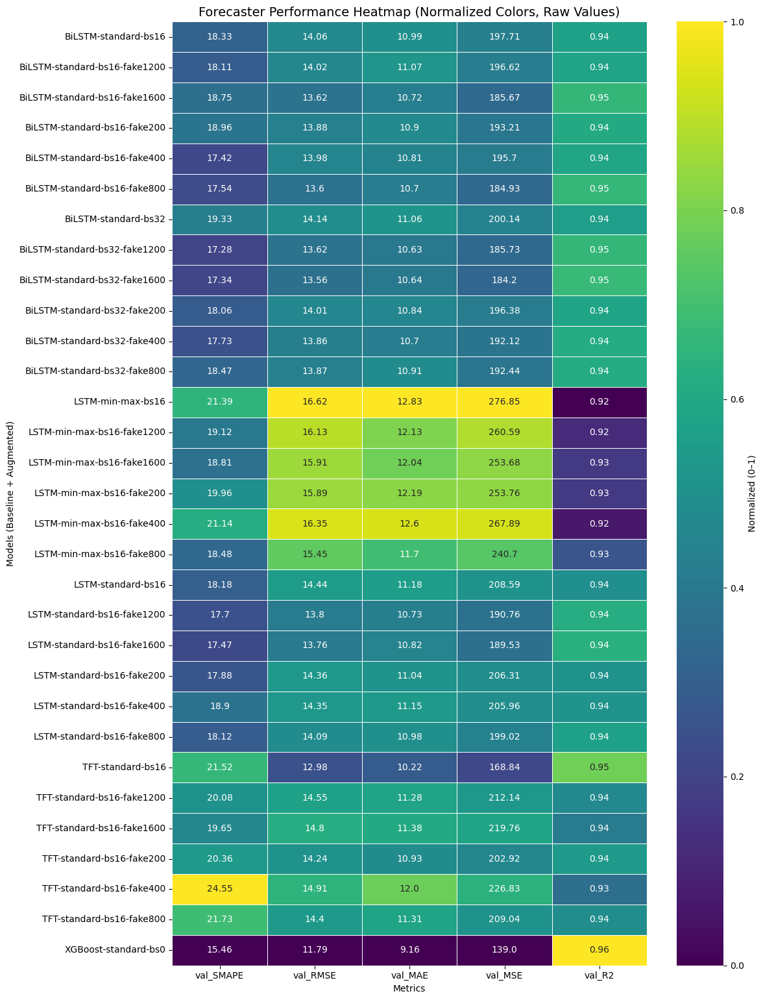

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Load your dataset
# df = pd.read_csv("wandb_experiments_augmentation.csv")
common_cols = df_test.columns.intersection(df_aug.columns)
df_aug_filtered = df_aug[common_cols]
df_test_filtered = df_test[common_cols]

# Concatenate
df = pd.concat([df_test_filtered, df_aug_filtered], axis=0, ignore_index=True)

# Create base config name
df['config_base'] = df['model_name'] + '-' + df['scaler_name'] + '-bs' + df['batch_size'].astype(str)

# Add 'config_full' including fake_data_length if augmented
df['config_full'] = df['config_base']

df.loc[df['data_augmentation'] == True, 'config_full'] = (
    df['config_base'] + '-fake' + df['fake_data_length'].astype(str)
)

# Metrics of interest
metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']

# Compute mean over seeds per config
heatmap_data = (
    df.groupby('config_full')[metrics]
    .mean()
    .sort_index()
)

# Normalize per column (metric) for color scale
normalized = (heatmap_data - heatmap_data.min()) / (heatmap_data.max() - heatmap_data.min())

# Plot heatmap
plt.figure(figsize=(12, len(heatmap_data) * 0.5))
sns.heatmap(
    normalized,
    annot=heatmap_data.round(2),
    fmt='',
    cmap='viridis',
    linewidths=0.5,
    cbar_kws={'label': 'Normalized (0–1)'}
)

plt.title("Forecaster Performance Heatmap (Normalized Colors, Raw Values)", fontsize=14)
plt.xlabel("Metrics")
plt.ylabel("Models (Baseline + Augmented)")
plt.tight_layout()
# plt.show()
plt.savefig(f"Plots/heatmap_mse_augmentation.png")


### Boxplots of the forecasters

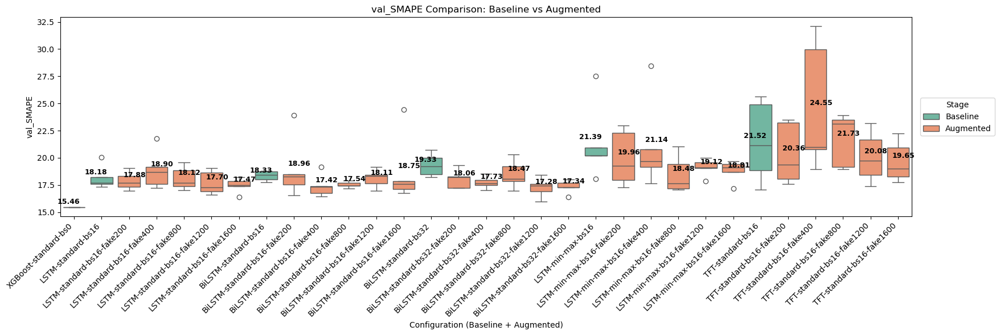

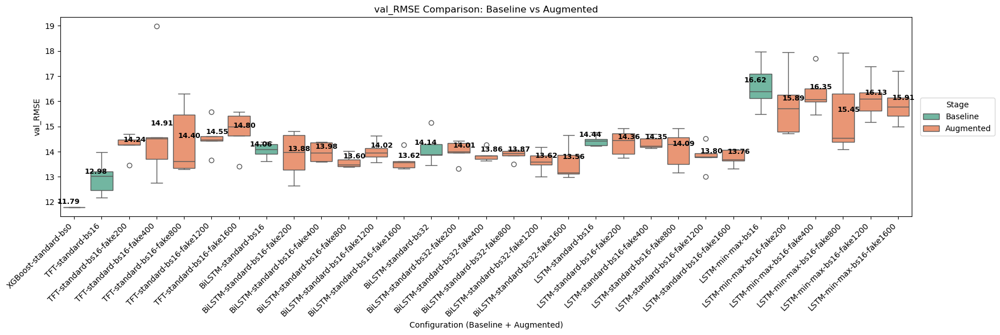

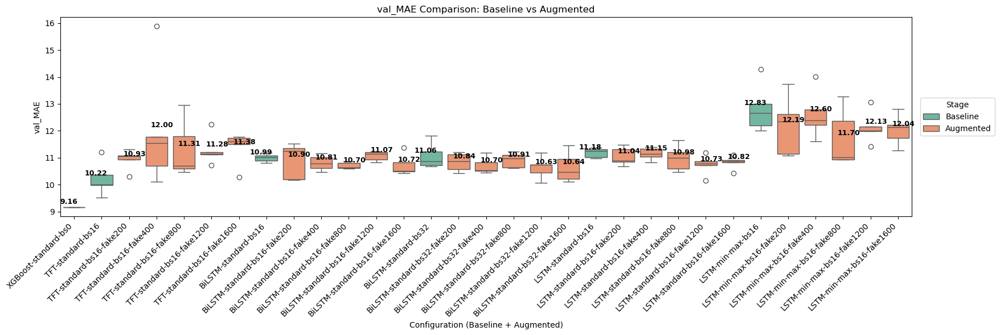

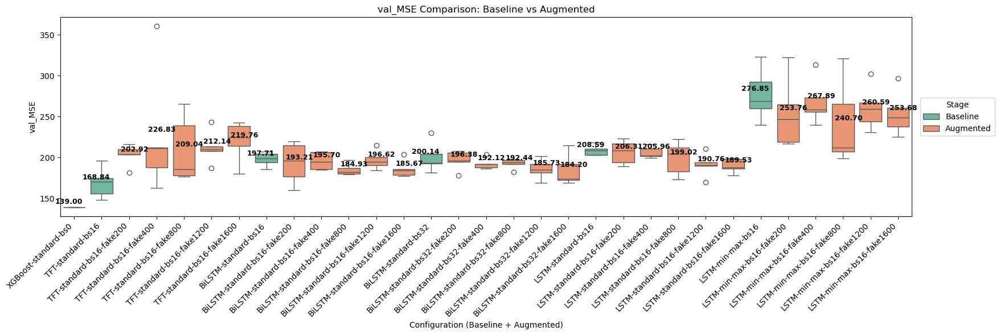

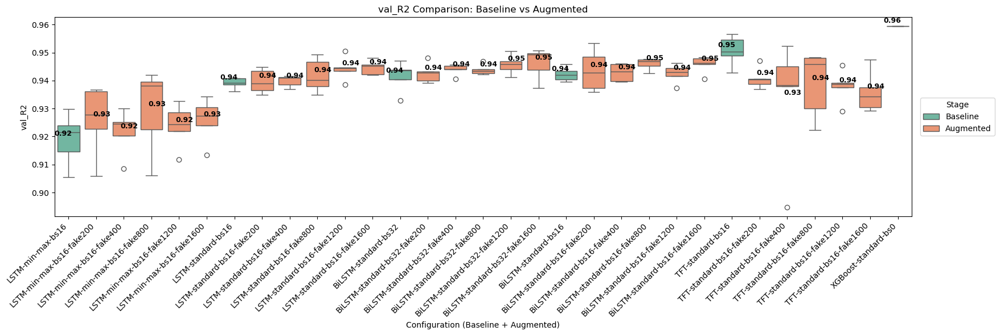

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_augmented_vs_baseline_boxplots(metric, df):
    # Create config_name: includes fake_data_length for augmented runs
    base = df['model_name'] + '-' + df['scaler_name'] + '-bs' + df['batch_size'].astype(str)
    augmented = df['data_augmentation'] & df['fake_data_length'].notna()
    df['config_name'] = base.where(~augmented, base + '-fake' + df['fake_data_length'].astype(str))

    # Add a new column: stage = 'Baseline' or 'Augmented'
    df['stage'] = df['data_augmentation'].apply(lambda x: 'Augmented' if x else 'Baseline')

    # Sort configs by baseline metric mean
    baseline_order = (
        df[df['stage'] == 'Baseline']
        .groupby('config_name')[metric]
        .mean()
        .sort_values()
        .index
    )

    # Include both baseline and augmented config names (in correct order)
    all_order = []
    for base_config in baseline_order:
        all_order.append(base_config)
        # Add all augmented variants of this config, sorted by fake_data_length
        variants = df[df['config_name'].str.startswith(base_config + '-fake')]['config_name'].unique()
        all_order.extend(sorted(variants, key=lambda x: int(x.split('fake')[-1])))

    # Plot
    plt.figure(figsize=(max(12, len(all_order) * 0.6), 6))
    ax = sns.boxplot(
        data=df[df['config_name'].isin(all_order)],
        x='config_name',
        y=metric,
        hue='stage',
        order=all_order,
        palette='Set2'
    )

    # Annotate mean values
    grouped = df.groupby(['config_name', 'stage'])[metric].mean()
    offsets = {'Baseline': -0.2, 'Augmented': 0.2}
    for i, config in enumerate(all_order):
        for stage in ['Baseline', 'Augmented']:
            if (config, stage) in grouped:
                mean_val = grouped[(config, stage)]
                ax.text(
                    i + offsets[stage],
                    mean_val + 0.01 * (df[metric].max() - df[metric].min()),
                    f"{mean_val:.2f}",
                    ha='center', va='bottom', fontsize=9,
                    color='black', fontweight='bold'
                )

    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Configuration (Baseline + Augmented)")
    plt.ylabel(metric)
    plt.title(f"{metric} Comparison: Baseline vs Augmented")
    plt.legend(
        title="Stage",
        loc='center left',
        bbox_to_anchor=(1.01, 0.5),  # pushes it fully outside to the right
        borderaxespad=0.
    )
    plt.tight_layout(rect=[0, 0, 0.95, 1])  # leave room for legend on the right
    # plt.show()
    plt.savefig(f"Plots/boxplot_{metric}_mse_augmentation.png")


df_combined = pd.concat([df_test, df_aug], axis=0, ignore_index=True)

metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']
for metric in metrics:
    plot_augmented_vs_baseline_boxplots(metric, df_combined)

# <span style="color:red; font-weight:bold">Pinball loss for DL models + XGBoost(quantile)</span>

## <span style="color:orange; font-weight:bold"> Validation stage (train vs val_1)</span>

### Import dataset

In [34]:
import numpy as np
import pandas as pd

df = pd.read_csv("wandb_pinball_updated.csv")

# Concatenate the TFT runs
df_TFT = pd.read_csv("TFT_pinball.csv", usecols=[c for c in df.columns if c in pd.read_csv("TFT_pinball.csv", nrows=0).columns])
# Reindex df2 to ensure it has exactly the same columns/order as df1
df_TFT = df_TFT.reindex(columns=df.columns)
df = pd.concat([df, df_TFT], ignore_index=True)

# === Keep only validation stage runs ===
df_val = df[df['testing_stage'] == False].copy()

### Boxplots of the forecasters

/tmp/ipykernel_36508/2655867732.py:96: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=sub_df, x='config_name', y='pinball_loss', order=order, palette='Set2')
/tmp/ipykernel_36508/2655867732.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_low, x='config_name', y='pinball_loss', order=order_low,
/tmp/ipykernel_36508/2655867732.py:57: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_36508/2655867732.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.

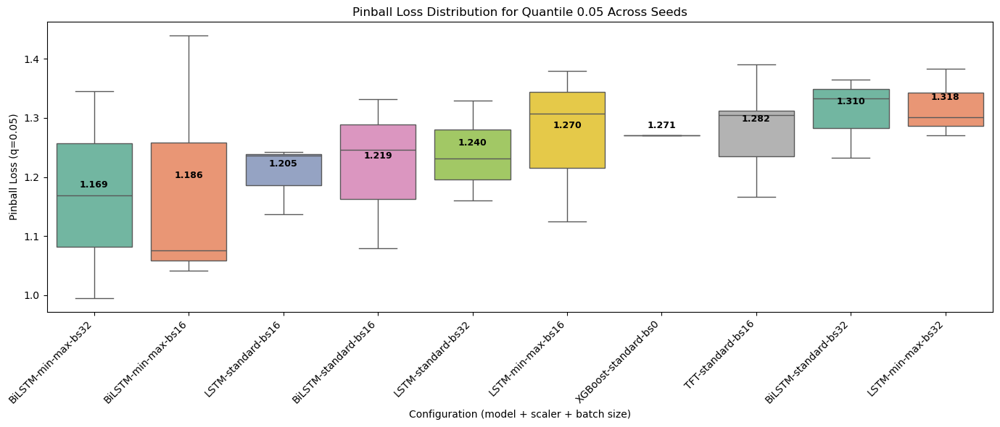

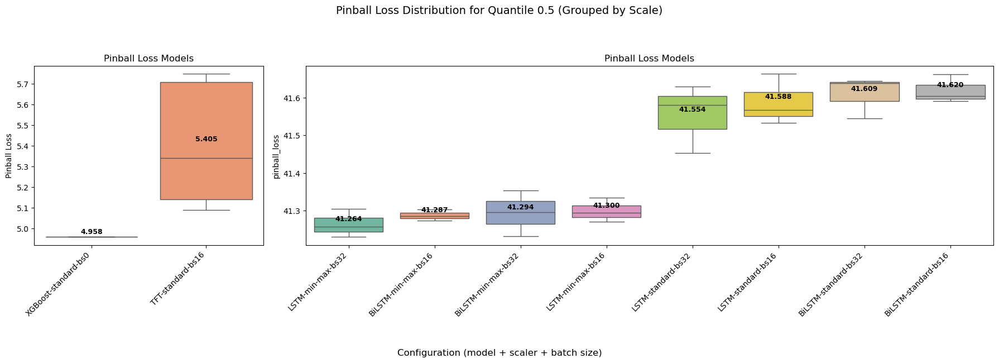

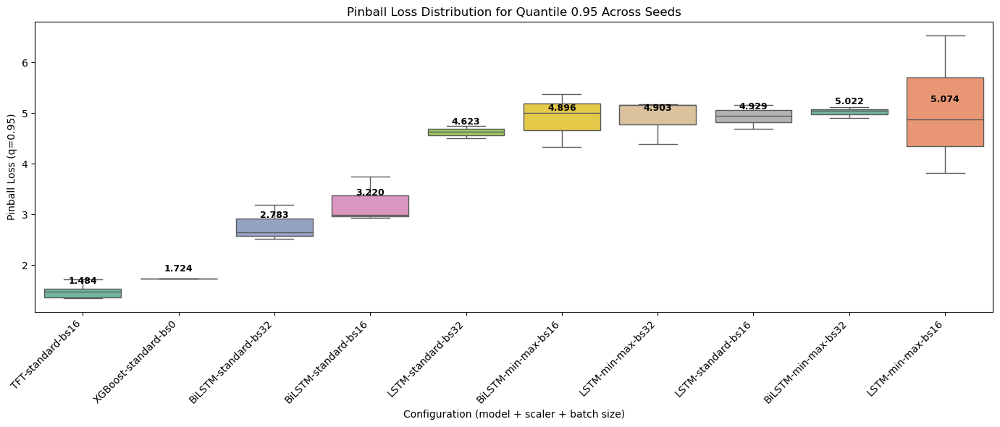

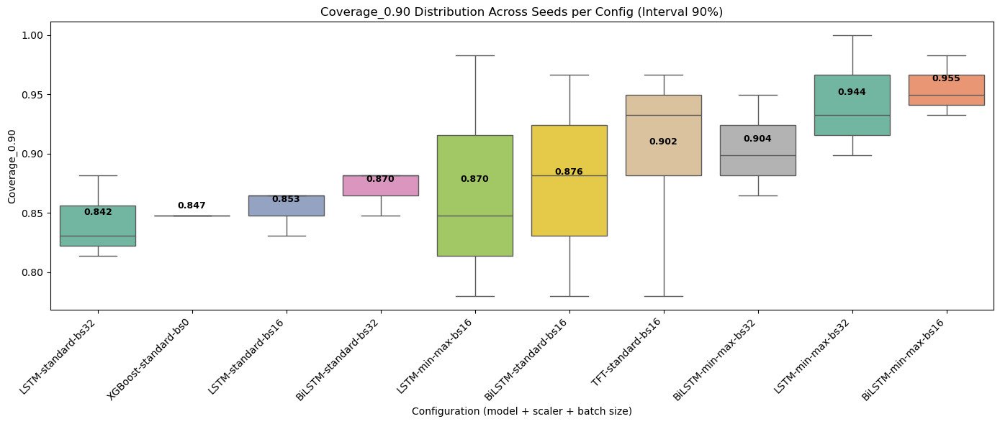

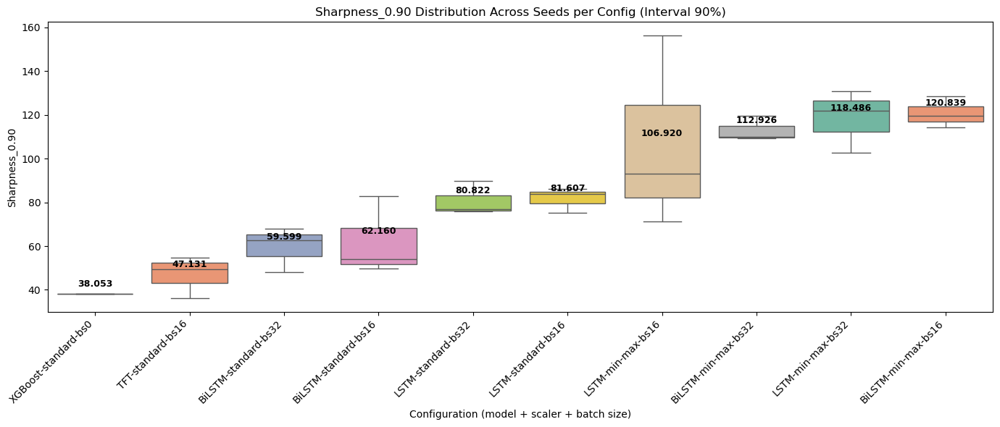

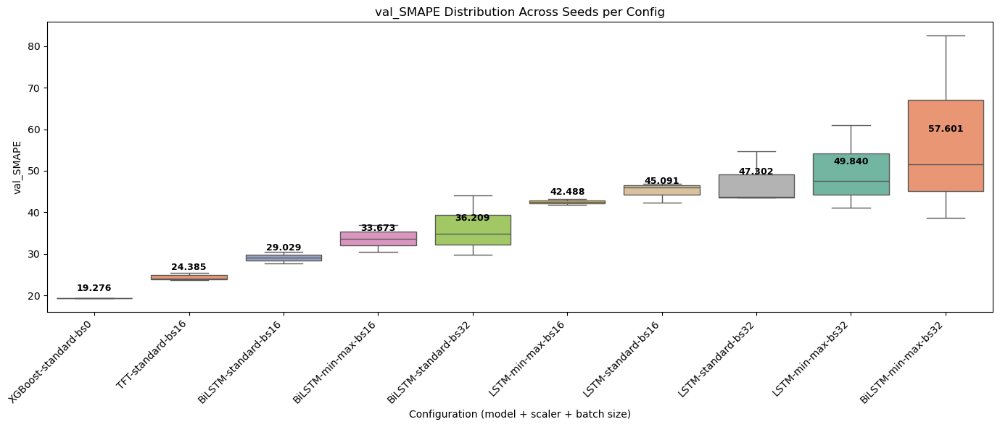

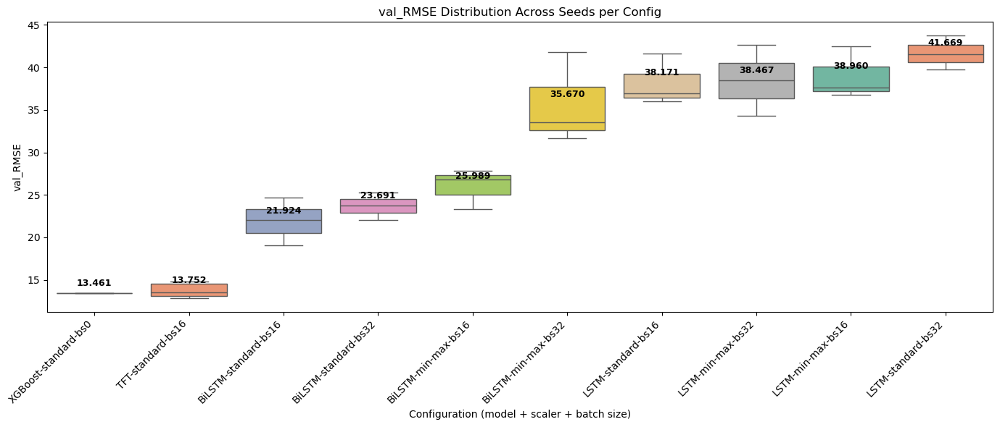

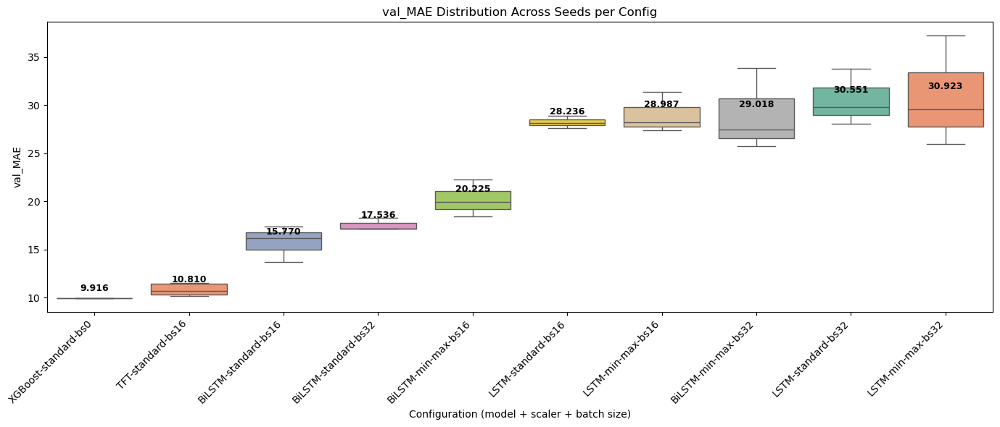

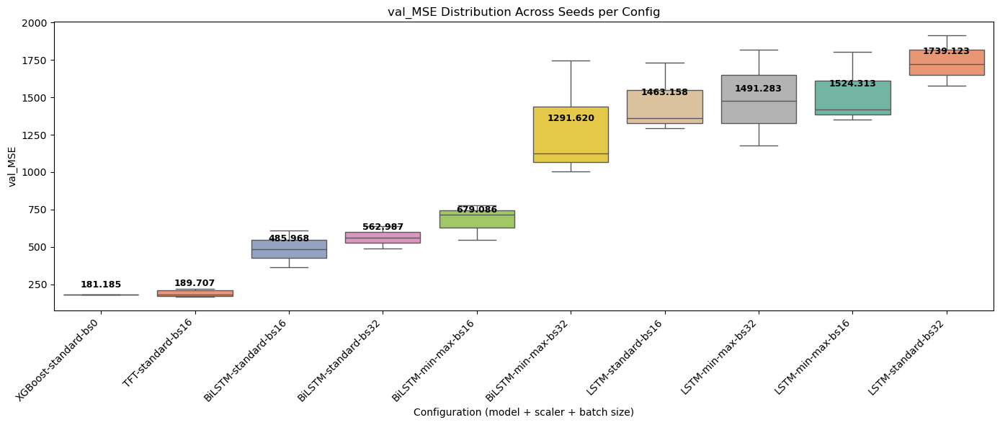

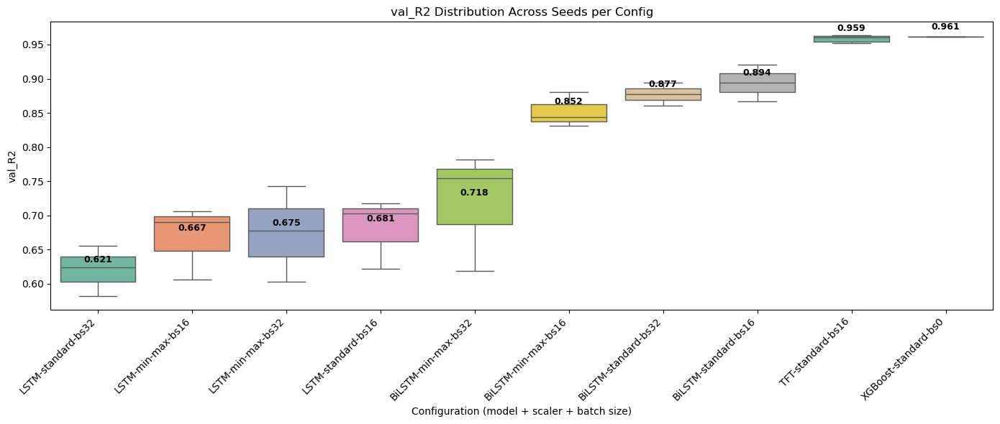

In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === STEP 1: Define metric groups ===
pinball_cols = ['Pinball_0.05', 'Pinball_0.50', 'Pinball_0.95']
coverage_cols = ['Coverage_0.90']
sharpness_cols = ['Sharpness_0.90']
standard_metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']

# === STEP 2: Prepare long format for pinball ===
df_pinball_long = df_val.melt(
    id_vars=['model_name', 'scaler_name', 'batch_size', 'seed', 'Name'],
    value_vars=pinball_cols,
    var_name='quantile',
    value_name='pinball_loss'
)

df_pinball_long['quantile'] = df_pinball_long['quantile'].str.extract(r'(\d+\.\d+)').astype(float)
df_pinball_long['config_name'] = (
    df_pinball_long['model_name'] + '-' +
    df_pinball_long['scaler_name'] + '-bs' +
    df_pinball_long['batch_size'].astype(str)
)

# === STEP 3: Add config_name to original df for other plots ===
df_val['config_name'] = (
    df_val['model_name'] + '-' +
    df_val['scaler_name'] + '-bs' +
    df_val['batch_size'].astype(str)
)

# === STEP 4: Plotting functions ===

def plot_pinball_loss_boxplots(df_long):
    for q in sorted(df_long['quantile'].unique()):
        sub_df = df_long[df_long['quantile'] == q]
        mean_vals = sub_df.groupby('config_name')['pinball_loss'].mean()

        if q == 0.5:
            # Special handling: group low/high pinball loss models
            threshold = 15  # Adjust as needed
            low_configs = mean_vals[mean_vals < threshold].index
            high_configs = mean_vals[mean_vals >= threshold].index

            df_low = sub_df[sub_df['config_name'].isin(low_configs)]
            df_high = sub_df[sub_df['config_name'].isin(high_configs)]

            fig, axes = plt.subplots(1, 2, figsize=(18, 6.5), gridspec_kw={'width_ratios': [1, 3]})

            # Low-loss configs
            if not df_low.empty:
                order_low = df_low.groupby('config_name')['pinball_loss'].mean().sort_values().index
                sns.boxplot(data=df_low, x='config_name', y='pinball_loss', order=order_low,
                            ax=axes[0], palette='Set2')
                axes[0].set_title("Pinball Loss Models")
                axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')
                axes[0].set_xlabel("")

                # Annotations
                y_min, y_max = axes[0].get_ylim()
                offset = 0.01 * (y_max - y_min)
                for i, config in enumerate(order_low):
                    val = mean_vals[config]
                    axes[0].text(i, val + offset, f"{val:.3f}", ha='center', va='bottom',
                                fontsize=9, color='black', fontweight='bold')

            # High-loss configs
            if not df_high.empty:
                order_high = df_high.groupby('config_name')['pinball_loss'].mean().sort_values().index
                sns.boxplot(data=df_high, x='config_name', y='pinball_loss', order=order_high,
                            ax=axes[1], palette='Set2')
                axes[1].set_title("Pinball Loss Models")
                axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
                axes[1].set_xlabel("")

                y_min, y_max = axes[1].get_ylim()
                offset = 0.01 * (y_max - y_min)
                for i, config in enumerate(order_high):
                    val = mean_vals[config]
                    axes[1].text(i, val + offset, f"{val:.3f}", ha='center', va='bottom',
                                fontsize=9, color='black', fontweight='bold')

            # Final layout
            fig.suptitle(f"Pinball Loss Distribution for Quantile {q} (Grouped by Scale)", fontsize=14)
            fig.supxlabel("Configuration (model + scaler + batch size)")
            axes[0].set_ylabel("Pinball Loss")
            plt.tight_layout(rect=[0, 0.05, 1, 0.92])
            plt.savefig(f"Plots/boxplot_Pinball_{q}_pinball_validation.png")

        else:
            # Normal single boxplot for q ≠ 0.5
            order = sub_df.groupby('config_name')['pinball_loss'].mean().sort_values().index

            plt.figure(figsize=(14, 6))
            sns.boxplot(data=sub_df, x='config_name', y='pinball_loss', order=order, palette='Set2')

            y_min, y_max = sub_df['pinball_loss'].min(), sub_df['pinball_loss'].max()
            y_range = y_max - y_min
            offset = 0.02 * y_range
            for i, config in enumerate(order):
                mean_val = mean_vals[config]
                plt.text(i, mean_val + offset, f"{mean_val:.3f}",
                         ha='center', va='bottom', fontsize=9, color='black', fontweight='bold')

            plt.xticks(rotation=45, ha='right')
            plt.xlabel("Configuration (model + scaler + batch size)")
            plt.ylabel(f"Pinball Loss (q={q})")
            plt.title(f"Pinball Loss Distribution for Quantile {q} Across Seeds")
            plt.tight_layout()
            plt.savefig(f"Plots/boxplot_Pinball_{q}_pinball_validation.png")

def plot_single_metric_boxplot(df, metric, title_suffix=""):
    order = df.groupby('config_name')[metric].mean().sort_values().index
    mean_vals = df.groupby('config_name')[metric].mean()

    plt.figure(figsize=(14, 6))
    sns.boxplot(data=df, x='config_name', y=metric, order=order, palette='Set2')

    y_min, y_max = df[metric].min(), df[metric].max()
    y_range = y_max - y_min
    offset = 0.02 * y_range
    for i, config in enumerate(order):
        mean_val = mean_vals[config]
        plt.text(i, mean_val + offset, f"{mean_val:.3f}",
                 ha='center', va='bottom', fontsize=9, color='black', fontweight='bold')

    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Configuration (model + scaler + batch size)")
    plt.ylabel(metric)
    plt.title(f"{metric} Distribution Across Seeds per Config{title_suffix}")
    plt.tight_layout()
    plt.savefig(f"Plots/boxplot_{metric}_pinball_validation.png")

# === STEP 5: Generate all plots ===

# 1. Pinball loss plots
plot_pinball_loss_boxplots(df_pinball_long)

# 2. Interval-based metrics
plot_single_metric_boxplot(df_val, 'Coverage_0.90', " (Interval 90%)")
plot_single_metric_boxplot(df_val, 'Sharpness_0.90', " (Interval 90%)")

# 3. Optional: Standard regression metrics for q=0.5 model
for metric in standard_metrics:
    plot_single_metric_boxplot(df_val, metric)


In [36]:
print("The best configurations (based on SMAPE) and quantile metrics are:")
print("1. Model: XGBoost, Scaler: StandardScaler")
print("2. Model: BiLSTM, Scaler: StandardScaler, Batch Size: 16")
print("3. Model: BiLSTM, Scaler: StandardScaler, Batch Size: 32")
print("4. Model: TFT, Scaler: StandardScaler, Batch Size: 16")

The best configurations (based on SMAPE) and quantile metrics are:
1. Model: XGBoost, Scaler: StandardScaler
2. Model: BiLSTM, Scaler: StandardScaler, Batch Size: 16
3. Model: BiLSTM, Scaler: StandardScaler, Batch Size: 32
4. Model: TFT, Scaler: StandardScaler, Batch Size: 16


### heatmap of metrics vs forecasters

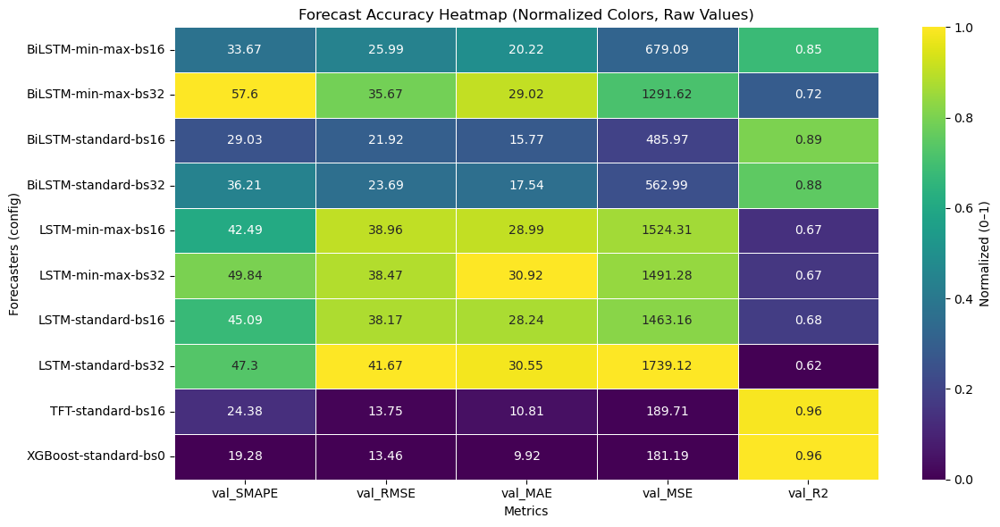

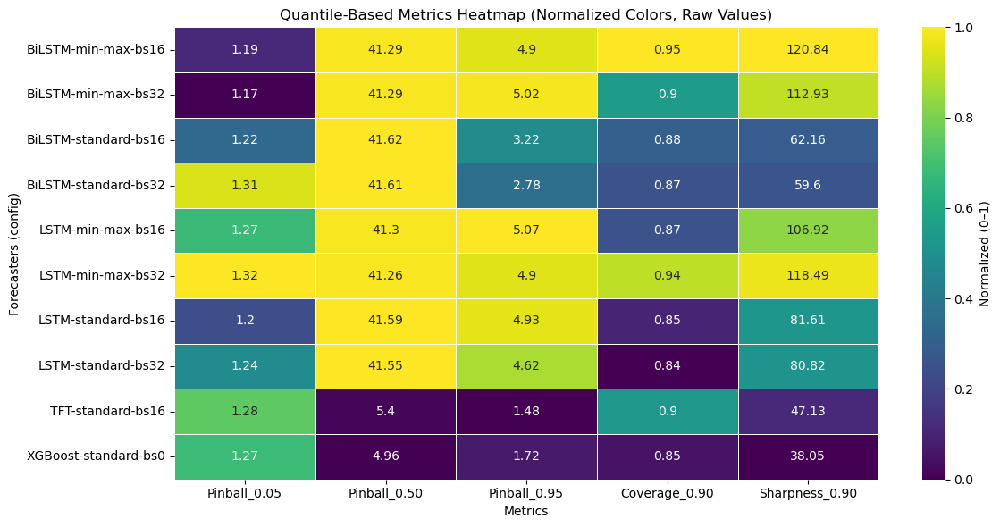

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

# === STEP 1: Create config name if needed ===
df_val['config_name'] = (
    df_val['model_name'] + '-' +
    df_val['scaler_name'] + '-bs' +
    df_val['batch_size'].astype(str)
)

# === STEP 2: Standard forecast metrics ===
standard_metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']
standard_data = df_val.groupby('config_name')[standard_metrics].mean()
standard_norm = (standard_data - standard_data.min()) / (standard_data.max() - standard_data.min())

# === STEP 3: Quantile-aware metrics ===
quantile_metrics = ['Pinball_0.05', 'Pinball_0.50', 'Pinball_0.95', 'Coverage_0.90', 'Sharpness_0.90']
quantile_data = df_val.groupby('config_name')[quantile_metrics].mean()
quantile_norm = (quantile_data - quantile_data.min()) / (quantile_data.max() - quantile_data.min())

# === STEP 4: Plot heatmaps ===

def plot_heatmap(data, normalized, title):
    plt.figure(figsize=(12, len(data) * 0.6))
    sns.heatmap(
        normalized,
        annot=data.round(2),
        fmt='',
        cmap='viridis',
        linewidths=0.5,
        cbar_kws={'label': 'Normalized (0–1)'}
    )
    plt.title(title)
    plt.xlabel("Metrics")
    plt.ylabel("Forecasters (config)")
    plt.tight_layout()
    if title.startswith("Forecast"): #standard metrics
        plt.savefig(f"Plots/heatmap_stand_pinball_validation.png")
    else: # quantile metrics
        plt.savefig(f"Plots/heatmap_quant_pinball_validation.png")


# Plot standard metrics heatmap
plot_heatmap(standard_data, standard_norm, "Forecast Accuracy Heatmap (Normalized Colors, Raw Values)")

# Plot quantile-aware metrics heatmap
plot_heatmap(quantile_data, quantile_norm, "Quantile-Based Metrics Heatmap (Normalized Colors, Raw Values)")



## <span style="color:blue; font-weight:bold"> Testing stage (train+val_1 vs test)</span>

### Import dataset

In [38]:
import numpy as np
import pandas as pd

df = pd.read_csv("wandb_pinball_updated.csv")

# Concatenate the TFT runs
df_TFT = pd.read_csv("TFT_pinball.csv", usecols=[c for c in df.columns if c in pd.read_csv("TFT_pinball.csv", nrows=0).columns])
# Reindex df2 to ensure it has exactly the same columns/order as df1
df_TFT = df_TFT.reindex(columns=df.columns)
df = pd.concat([df, df_TFT], ignore_index=True)

df_test = df[
    (df['testing_stage'] == True) &         # Only test stage runs
    (df['data_augmentation'] == False)      # Only non-augmented runs
].copy()

### Boxplots of the forecasters

/tmp/ipykernel_36508/889524505.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_36508/889524505.py:95: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')


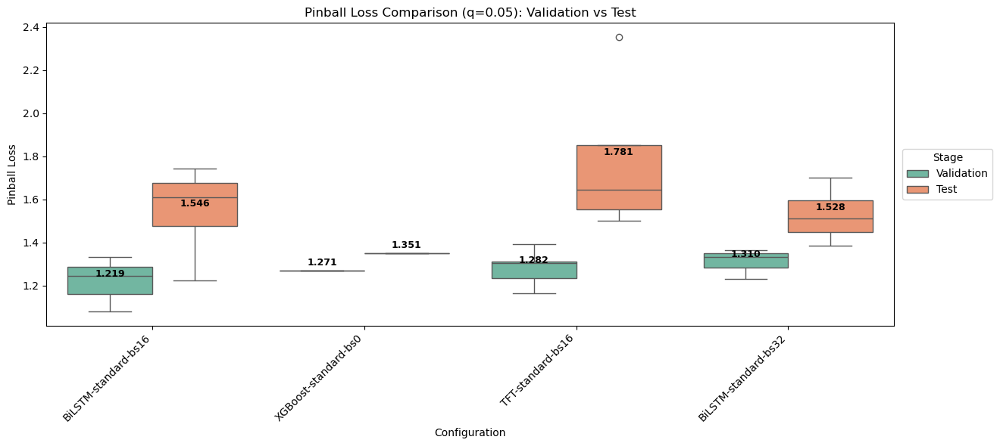

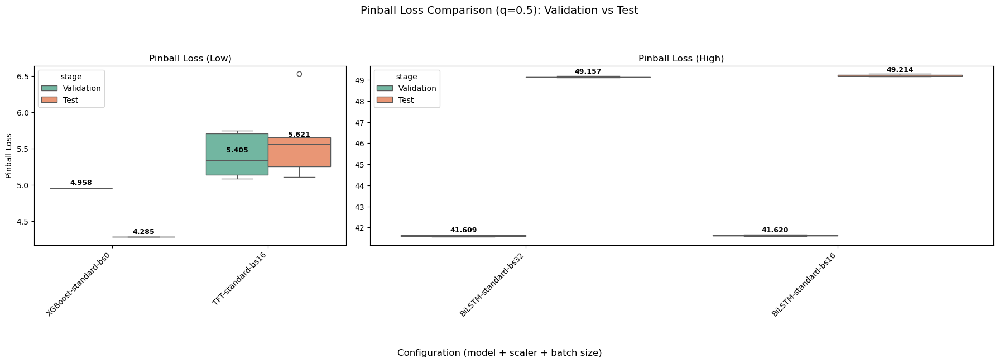

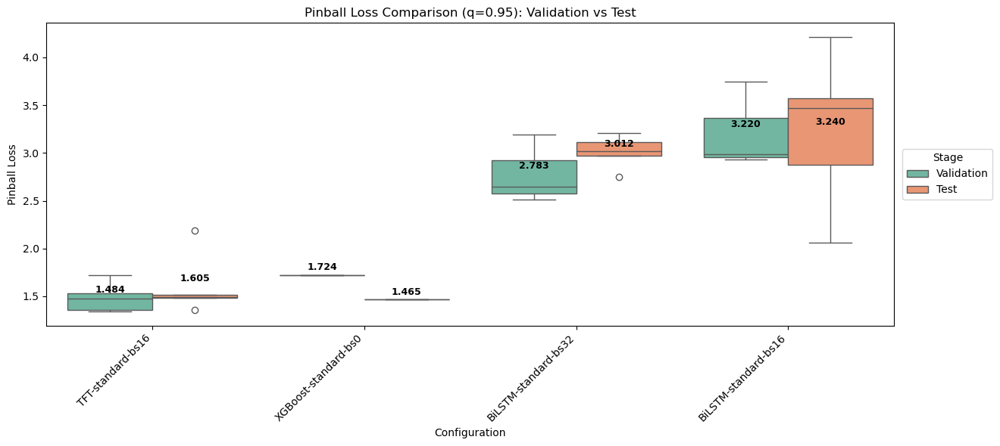

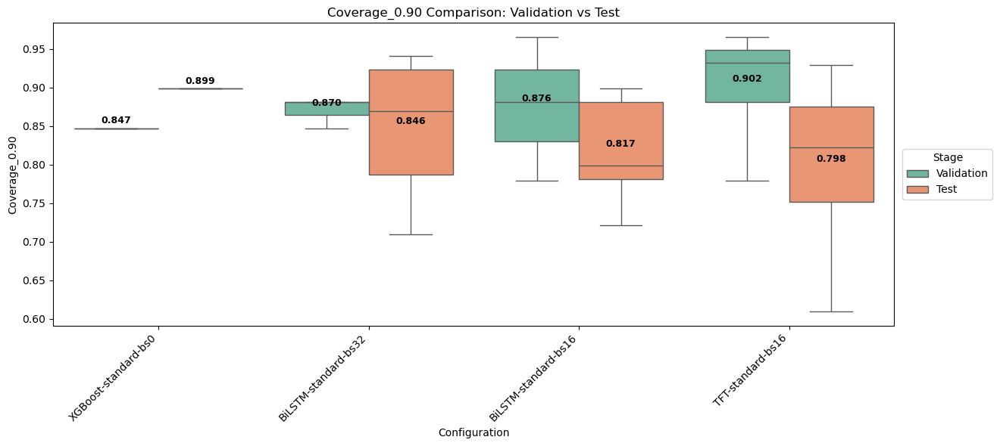

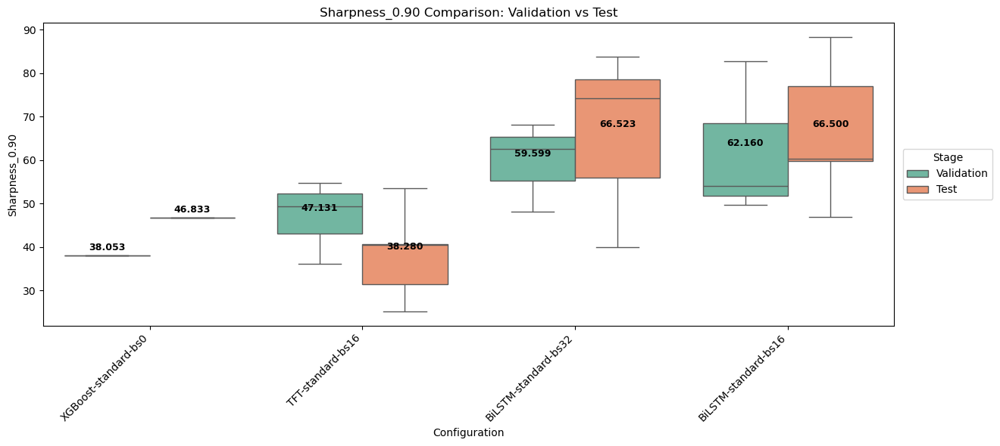

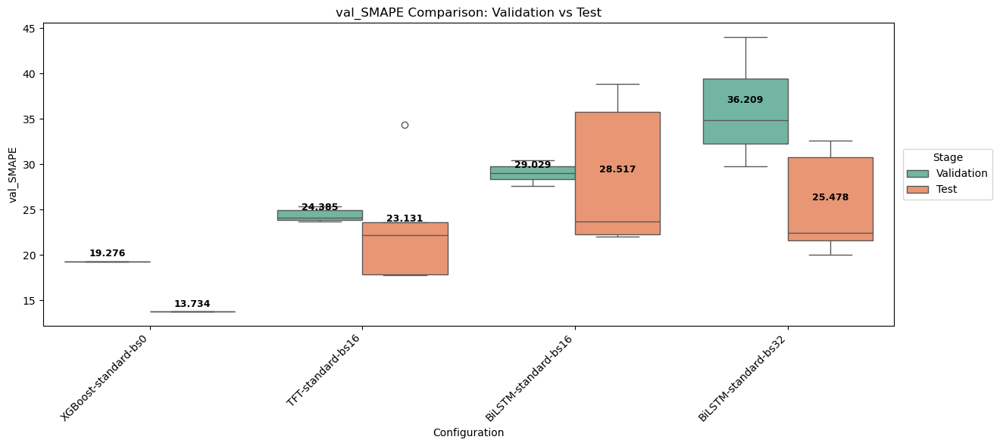

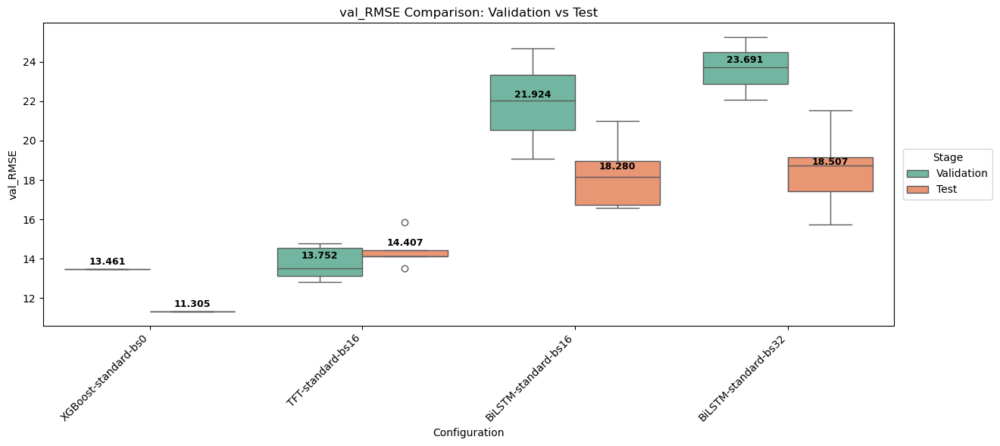

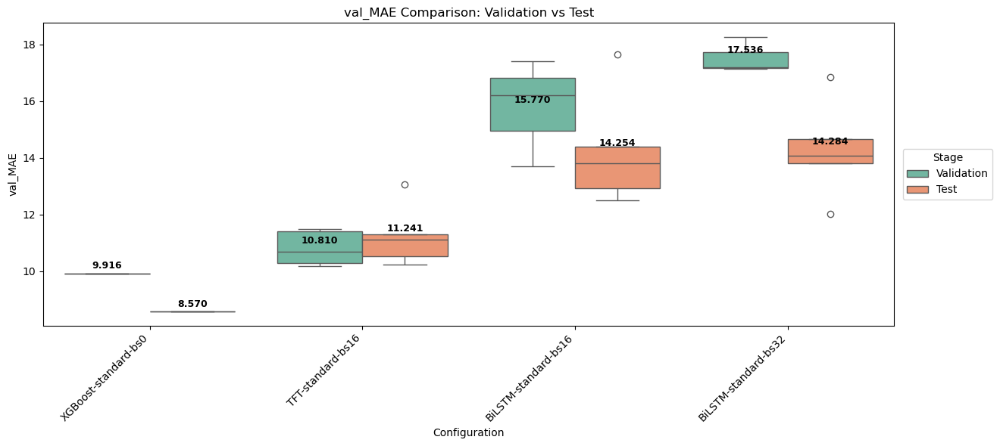

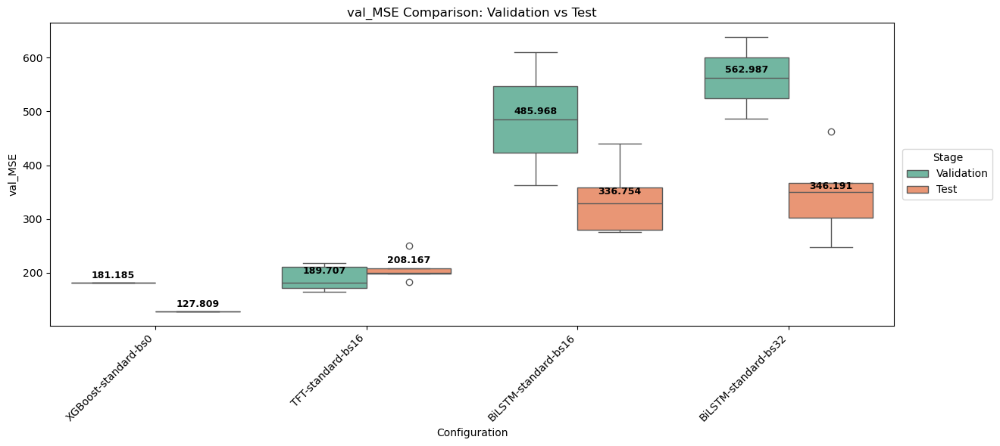

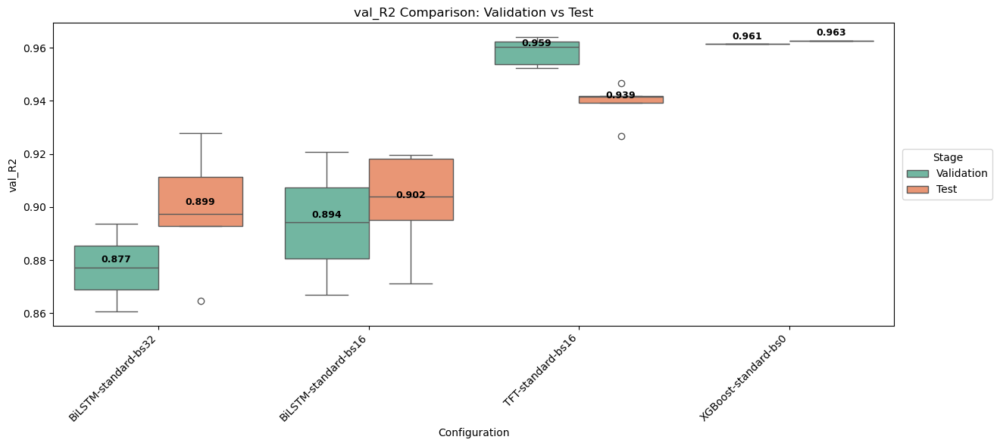

In [39]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === STEP 1: Define metric groups ===
pinball_cols = ['Pinball_0.05', 'Pinball_0.50', 'Pinball_0.95']
standard_metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']
interval_metrics = ['Coverage_0.90', 'Sharpness_0.90']

# === STEP 2: Add config and stage columns ===
df_val['config_name'] = (
    df_val['model_name'] + '-' +
    df_val['scaler_name'] + '-bs' +
    df_val['batch_size'].astype(str)
)
df_val['stage'] = 'Validation'

df_test['config_name'] = (
    df_test['model_name'] + '-' +
    df_test['scaler_name'] + '-bs' +
    df_test['batch_size'].astype(str)
)
df_test['stage'] = 'Test'

# === STEP 3: Filter df_val to only configs in df_test ===
allowed_configs = df_test['config_name'].unique()
df_val_filtered = df_val[df_val['config_name'].isin(allowed_configs)]

# === STEP 4: Pinball loss (melt to long format) ===
def melt_pinball(df):
    melted = df.melt(
        id_vars=['model_name', 'scaler_name', 'batch_size', 'seed', 'Name', 'config_name', 'stage'],
        value_vars=pinball_cols,
        var_name='quantile',
        value_name='pinball_loss'
    )
    melted['quantile'] = melted['quantile'].str.extract(r'(\d+\.\d+)').astype(float)
    return melted

df_pinball_long_val = melt_pinball(df_val_filtered)
df_pinball_long_test = melt_pinball(df_test)

df_combined_pinball = pd.concat([df_pinball_long_val, df_pinball_long_test], axis=0)
df_combined_metrics = pd.concat([df_val_filtered, df_test], axis=0)

# === STEP 5: Plotting functions ===
def plot_pinball_loss_comparison(df_long):
    for q in sorted(df_long['quantile'].unique()):
        sub_df = df_long[df_long['quantile'] == q]
        mean_vals = sub_df[sub_df['stage'] == 'Validation'].groupby('config_name')['pinball_loss'].mean()
        stage_order = ['Validation', 'Test']

        if q == 0.5:
            # Split into low and high mean pinball loss
            threshold = 15  # Adjust threshold as needed
            low_configs = mean_vals[mean_vals < threshold].index
            high_configs = mean_vals[mean_vals >= threshold].index

            df_low = sub_df[sub_df['config_name'].isin(low_configs)]
            df_high = sub_df[sub_df['config_name'].isin(high_configs)]

            fig, axes = plt.subplots(1, 2, figsize=(18,6.5), gridspec_kw={'width_ratios': [1, 2]})

            # Low-loss models
            if not df_low.empty:
                order_low = df_low[df_low['stage'] == 'Validation'].groupby('config_name')['pinball_loss'].mean().sort_values().index
                sns.boxplot(data=df_low, x='config_name', y='pinball_loss',
                            hue='stage', order=order_low, hue_order=stage_order,
                            ax=axes[0], palette='Set2')
                axes[0].set_title("Pinball Loss (Low)")
                axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')
                axes[0].set_xlabel("")
                axes[0].set_ylabel("Pinball Loss")

                # Annotate means
                grouped = df_low.groupby(['config_name', 'stage'])['pinball_loss'].mean()
                offsets = {'Validation': -0.2, 'Test': 0.2}
                y_min, y_max = axes[0].get_ylim()
                offset = 0.01 * (y_max - y_min)

                for i, config in enumerate(order_low):
                    for stage in stage_order:
                        if (config, stage) in grouped:
                            val = grouped[(config, stage)]
                            axes[0].text(i + offsets[stage], val + offset, f"{val:.3f}",
                                         ha='center', va='bottom', fontsize=9, color='black', fontweight='bold')

            # High-loss models
            if not df_high.empty:
                order_high = df_high[df_high['stage'] == 'Validation'].groupby('config_name')['pinball_loss'].mean().sort_values().index
                sns.boxplot(data=df_high, x='config_name', y='pinball_loss',
                            hue='stage', order=order_high, hue_order=stage_order,
                            ax=axes[1], palette='Set2')
                axes[1].set_title("Pinball Loss (High)")
                axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
                axes[1].set_xlabel("")
                axes[1].set_ylabel("")

                grouped = df_high.groupby(['config_name', 'stage'])['pinball_loss'].mean()
                y_min, y_max = axes[1].get_ylim()
                offset = 0.01 * (y_max - y_min)

                for i, config in enumerate(order_high):
                    for stage in stage_order:
                        if (config, stage) in grouped:
                            val = grouped[(config, stage)]
                            axes[1].text(i + offsets[stage], val + offset, f"{val:.3f}",
                                         ha='center', va='bottom', fontsize=9, color='black', fontweight='bold')

            fig.suptitle("Pinball Loss Comparison (q=0.5): Validation vs Test", fontsize=14)
            fig.supxlabel("Configuration (model + scaler + batch size)")
            plt.tight_layout(rect=[0, 0.05, 1, 0.92])
            plt.savefig(f"Plots/boxplot_Pinball_{q}_pinball_testing.png")

        else:
            # Standard single plot for q ≠ 0.5
            order = sub_df[sub_df['stage'] == 'Validation'].groupby('config_name')['pinball_loss'].mean().sort_values().index

            plt.figure(figsize=(14, 6))
            sns.boxplot(
                data=sub_df,
                x='config_name',
                y='pinball_loss',
                hue='stage',
                order=order,
                hue_order=stage_order,
                palette='Set2'
            )

            # Annotate means
            grouped = sub_df.groupby(['config_name', 'stage'])['pinball_loss'].mean()
            offsets = {'Validation': -0.2, 'Test': 0.2}
            y_min, y_max = sub_df['pinball_loss'].min(), sub_df['pinball_loss'].max()
            offset = 0.01 * (y_max - y_min)

            for i, config in enumerate(order):
                for stage in stage_order:
                    if (config, stage) in grouped:
                        val = grouped[(config, stage)]
                        plt.text(i + offsets[stage], val + offset, f"{val:.3f}",
                                 ha='center', va='bottom', fontsize=9, color='black', fontweight='bold')

            plt.xticks(rotation=45, ha='right')
            plt.xlabel("Configuration")
            plt.ylabel("Pinball Loss")
            plt.title(f"Pinball Loss Comparison (q={q}): Validation vs Test")
            plt.legend(title="Stage", loc='center left', bbox_to_anchor=(1.01, 0.5), borderaxespad=0.)
            plt.tight_layout(rect=[0, 0, 0.95, 1])
            plt.savefig(f"Plots/boxplot_Pinball_{q}_pinball_testing.png")

def plot_metric_comparison(df, metric):
    order = df[df['stage'] == 'Validation'].groupby('config_name')[metric].mean().sort_values().index
    stage_order = ['Validation', 'Test']

    plt.figure(figsize=(14, 6))
    sns.boxplot(
        data=df,
        x='config_name',
        y=metric,
        hue='stage',
        order=order,
        hue_order=stage_order,
        palette='Set2'
    )

    # Annotate means
    grouped = df.groupby(['config_name', 'stage'])[metric].mean()
    offsets = {'Validation': -0.2, 'Test': 0.2}
    y_min, y_max = df[metric].min(), df[metric].max()
    offset = 0.01 * (y_max - y_min)

    for i, config in enumerate(order):
        for stage in stage_order:
            if (config, stage) in grouped:
                val = grouped[(config, stage)]
                plt.text(i + offsets[stage], val + offset, f"{val:.3f}",
                         ha='center', va='bottom', fontsize=9, color='black', fontweight='bold')

    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Configuration")
    plt.ylabel(metric)
    plt.title(f"{metric} Comparison: Validation vs Test")
    plt.legend(title="Stage", loc='center left', bbox_to_anchor=(1.01, 0.5), borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.95, 1])
    plt.savefig(f"Plots/boxplot_{metric}_pinball_testing.png")

# === STEP 6: Run the plots ===

# Pinball losses
plot_pinball_loss_comparison(df_combined_pinball)

# Interval-based metrics
for metric in interval_metrics:
    plot_metric_comparison(df_combined_metrics, metric)

# Standard forecast metrics
for metric in standard_metrics:
    plot_metric_comparison(df_combined_metrics, metric)


### heatmap of metrics vs forecasters

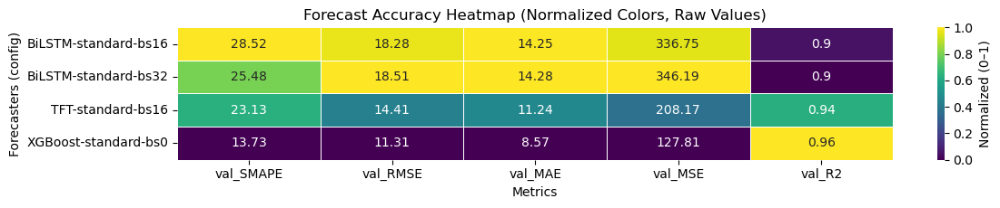

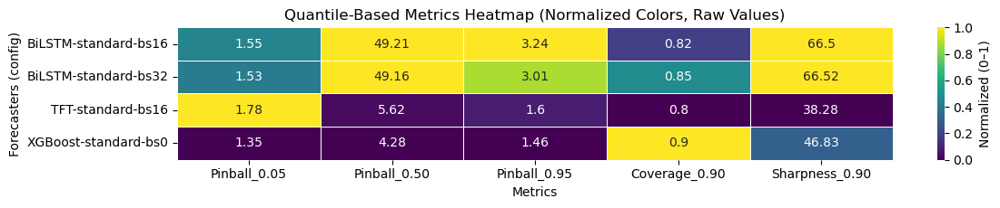

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

# === STEP 1: Create config name if needed ===
df_test['config_name'] = (
    df_test['model_name'] + '-' +
    df_test['scaler_name'] + '-bs' +
    df_test['batch_size'].astype(str)
)
    
# === STEP 2: Standard forecast metrics ===
standard_metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2']
standard_data = df_test.groupby('config_name')[standard_metrics].mean()
standard_norm = (standard_data - standard_data.min()) / (standard_data.max() - standard_data.min())

# === STEP 3: Quantile-aware metrics ===
quantile_metrics = ['Pinball_0.05', 'Pinball_0.50', 'Pinball_0.95', 'Coverage_0.90', 'Sharpness_0.90']
quantile_data = df_test.groupby('config_name')[quantile_metrics].mean()
quantile_norm = (quantile_data - quantile_data.min()) / (quantile_data.max() - quantile_data.min())

# === STEP 4: Plot heatmaps ===

def plot_heatmap(data, normalized, title):
    plt.figure(figsize=(12, len(data) * 0.6))
    sns.heatmap(
        normalized,
        annot=data.round(2),
        fmt='',
        cmap='viridis',
        linewidths=0.5,
        cbar_kws={'label': 'Normalized (0–1)'}
    )
    plt.title(title)
    plt.xlabel("Metrics")
    plt.ylabel("Forecasters (config)")
    plt.tight_layout()
    if title.startswith("Forecast"): #standard metrics
        plt.savefig(f"Plots/heatmap_stand_pinball_testing.png")
    else: # quantile metrics
        plt.savefig(f"Plots/heatmap_quant_pinball_testing.png")

# Plot standard metrics heatmap
plot_heatmap(standard_data, standard_norm, "Forecast Accuracy Heatmap (Normalized Colors, Raw Values)")

# Plot quantile-aware metrics heatmap
plot_heatmap(quantile_data, quantile_norm, "Quantile-Based Metrics Heatmap (Normalized Colors, Raw Values)")



## <span style="color:green; font-weight:bold"> Data Augmentation stage</span>

### Import dataset

In [41]:
import pandas as pd
df = pd.read_csv("wandb_pinball_updated.csv")

# Concatenate the TFT runs
df_TFT = pd.read_csv("TFT_pinball.csv", usecols=[c for c in df.columns if c in pd.read_csv("TFT_pinball.csv", nrows=0).columns])
# Reindex df2 to ensure it has exactly the same columns/order as df1
df_TFT = df_TFT.reindex(columns=df.columns)
df = pd.concat([df, df_TFT], ignore_index=True)


df_aug = df[
    (df['testing_stage'] == True) &         # Only test stage runs
    (df['data_augmentation'] == True)       # Only augmented runs
].copy()

### Compute Lift metric plots

In [42]:
import matplotlib.pyplot as plt
import pandas as pd
import os


def plot_metrics_per_model_and_batch(metrics, df_aug, df_all, nrows=3, ncols=3, dpi=300, save_dir=None):
    grouped_models = df_aug[['model_name', 'scaler_name', 'batch_size']].drop_duplicates()

    for _, row in grouped_models.iterrows():
        model = row['model_name']
        scaler = row['scaler_name']
        batch_size = row['batch_size']

        fig, axes = plt.subplots(
            nrows=nrows,
            ncols=ncols,
            figsize=(5 * ncols, 3.5 * nrows),
            dpi=dpi,
            sharex=False,
            sharey=False
        )
        axes = axes.flatten()

        for idx, metric in enumerate(metrics):
            if idx >= len(axes):
                break

            ax = axes[idx]

            # Filter all relevant runs
            df_filtered = df_all[
                (df_all['model_name'] == model) &
                (df_all['scaler_name'] == scaler) &
                (df_all['batch_size'] == batch_size) &
                (df_all['testing_stage'] == True)
            ]

            # Baseline (no augmentation)
            no_aug = (
                df_filtered[df_filtered['data_augmentation'] == False]
                .set_index(['scaler_name', 'seed'])[metric]
                .rename(f'{metric}_no_aug')
            )

            # Augmented
            aug_df = (
                df_filtered[df_filtered['data_augmentation'] == True]
                .set_index(['scaler_name', 'seed'])
                .join(no_aug, how='left')
                .reset_index()
            )

            # Compute lift
            delta_col = f'{metric}_lift'
            aug_df[delta_col] = (
                (aug_df[metric] - aug_df[f'{metric}_no_aug']) / aug_df[f'{metric}_no_aug']
            ) * 100

            # Aggregate
            stats = (
                aug_df
                .groupby('fake_data_length')[delta_col]
                .agg(['mean', 'std'])
                .reset_index()
            )

            # Plot error bars
            ax.errorbar(
                stats['fake_data_length'],
                stats['mean'],
                yerr=stats['std'],
                marker='o',
                capsize=3,
                label=f'{model} | {scaler} | bs={batch_size}'
            )

            # ⬇️ Add percentage lift text labels
            for x, y in zip(stats['fake_data_length'], stats['mean']):
                y_offset = (stats['mean'].max() - stats['mean'].min()) * 0.05  # 5% of y-range
                ax.text(x, y + y_offset, f"{y:.1f}%", ha='center', va='bottom', fontsize=8)

            # ✅ Highlight best lift point
            if not stats.empty:
                if 'R2' in metric:
                    best_idx = stats['mean'].idxmax()  # higher is better
                else:
                    best_idx = stats['mean'].idxmin()  # lower is better
                x_best = stats.loc[best_idx, 'fake_data_length']
                y_best = stats.loc[best_idx, 'mean']
                ax.scatter(x_best, y_best, color='red', s=60, marker='*', zorder=5, label='Best')

            ax.axhline(0, linestyle=':', color='gray')

            # Titles and labels
            if metric.lower() == 'val_r2':
                ax.set_title(f"% Δ{metric} (Positive = Improvement)")
            else:
                ax.set_title(f"% Δ{metric} (Negative = Improvement)")
            ax.set_xlabel("fake_data_length")
            ax.set_ylabel("Percentage Lift (%)")
            ax.legend(fontsize=8)

        # Turn off unused axes
        for idx in range(len(metrics), len(axes)):
            axes[idx].axis("off")

        plt.tight_layout()
        plt.suptitle(f"Lift – {model} | {scaler} | bs={batch_size}", y=1.03, fontsize=18)

        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            save_path = os.path.join(save_dir, f"lift_{model}_{scaler}_bs{batch_size}_pinball.png")
            plt.savefig(save_path, dpi=dpi, bbox_inches='tight')

        plt.show()

ERROR_METRICS = {"SMAPE", "RMSE", "MAE", "MSE", "Pinball", "Sharpness"}  # lower is better
GOOD_METRICS  = {"R2"}  # higher is better

def _is_good_metric(metric_name: str) -> bool:
    # crude but robust: check if any good metric token is inside the metric name (case-insensitive)
    name = metric_name.upper()
    return any(tok in name for tok in GOOD_METRICS)

def compute_lift_stats_for_group(df_all, model, scaler, batch_size, metrics):
    """Returns dict(metric -> stats_df with columns: fake_data_length, mean, std)"""
    out = {}
    df_filtered = df_all[
        (df_all['model_name'] == model) &
        (df_all['scaler_name'] == scaler) &
        (df_all['batch_size'] == batch_size) &
        (df_all['testing_stage'] == True)
    ].copy()

    # Build baseline per seed
    base = (
        df_filtered[df_filtered['data_augmentation'] == False]
        .set_index(['seed'])
    )

    # All augmented rows joined with baseline per seed
    aug = (
        df_filtered[df_filtered['data_augmentation'] == True]
        .set_index(['seed'])
        .join(base[[m for m in metrics]], rsuffix='_no_aug', how='left')
        .reset_index()
    )

    for metric in metrics:
        lift = ((aug[metric] - aug[f"{metric}_no_aug"]) / aug[f"{metric}_no_aug"]) * 100
        tmp = aug[['fake_data_length']].copy()
        tmp['lift'] = lift
        stats = tmp.groupby('fake_data_length')['lift'].agg(['mean', 'std']).reset_index()
        out[metric] = stats
    return out

def format_mean_std(mean, std, decimals=1):
    if pd.isna(mean):
        return ""
    if pd.isna(std) or std == 0:
        return f"{mean:.{decimals}f}\\%"
    return f"{mean:.{decimals}f}±{std:.{decimals}f}\\%"

def build_lift_table_for_group(df_all, model, scaler, batch_size, metrics, decimals=1):
    """Returns (wide_df, best_rows_df) where wide_df has one row per metric and columns per fake_data_length (+ Best columns)."""
    stats_dict = compute_lift_stats_for_group(df_all, model, scaler, batch_size, metrics)

    # Collect all augmentation sizes to define consistent column order
    all_lengths = sorted(set().union(*[set(s['fake_data_length']) for s in stats_dict.values()]))

    rows = []
    best_rows = []
    for metric in metrics:
        stats = stats_dict[metric]
        # map for quick lookup
        m = {int(r['fake_data_length']): (r['mean'], r['std']) for _, r in stats.iterrows()}
        # find best index (min for errors, max for goodness)
        is_good = _is_good_metric(metric)
        if not stats.empty:
            best_idx = stats['mean'].idxmax() if is_good else stats['mean'].idxmin()
            best_len = int(stats.loc[best_idx, 'fake_data_length'])
            best_mean = float(stats.loc[best_idx, 'mean'])
        else:
            best_len, best_mean = (np.nan, np.nan)

        row = {"Metric": metric}
        for L in all_lengths:
            mean, std = m.get(L, (np.nan, np.nan))
            row[f"{L}"] = format_mean_std(mean, std, decimals)

        # Best columns
        direction = "↑" if is_good else "↓"
        row["Best (lift)"] = f"{best_mean:.{decimals}f}\\% {direction}" if pd.notna(best_mean) else ""
        row["Best n"] = f"{best_len}" if pd.notna(best_len) else ""
        rows.append(row)

        best_rows.append({
            "Metric": metric,
            "Best_n": best_len,
            "Best_lift_mean_%": best_mean
        })

    wide_df = pd.DataFrame(rows)
    best_rows_df = pd.DataFrame(best_rows)
    # Order columns nicely
    wide_df = wide_df[["Metric"] + [str(L) for L in all_lengths] + ["Best (lift)", "Best n"]]
    return wide_df, best_rows_df

def tables_to_latex(
    df_all,
    df_aug,  # only used to enumerate groups
    metrics,
    save_dir="latex_tables",
    decimals=1,
    combine_all=False,
    table_caption_tpl="Lift (Δ%) vs. baseline across synthetic lengths for {model} | {scaler} | bs={bs}. Negative is better for error metrics; positive is better for R².",
    table_label_tpl="tab:lift_{model}_{scaler}_bs{bs}",
    use_booktabs=True
):
    os.makedirs(save_dir, exist_ok=True)
    grouped = df_aug[['model_name', 'scaler_name', 'batch_size']].drop_duplicates()

    combined_tables = []

    for _, row in grouped.iterrows():
        model = row['model_name']
        scaler = row['scaler_name']
        bs = row['batch_size']

        table_df, _ = build_lift_table_for_group(df_all, model, scaler, bs, metrics, decimals=decimals)

        # Escape underscores etc. for LaTeX in the *data*, not in the caption/label
        table_tex = table_df.to_latex(
            index=False,
            escape=True,
            column_format="l" + "c"*(table_df.shape[1]-1),
            longtable=False,
            bold_rows=False,
            na_rep="",
            caption=table_caption_tpl.format(model=model, scaler=scaler, bs=bs),
            label=table_label_tpl.format(model=str(model).replace(' ',''), scaler=str(scaler).replace(' ',''), bs=bs),
            multicolumn=True,
            multicolumn_format='c',
            buf=None
        )

        if use_booktabs:
            table_tex = table_tex.replace("\\toprule", "\\toprule").replace("\\midrule", "\\midrule").replace("\\bottomrule", "\\bottomrule")
        # Save per-group tex
        fname = os.path.join(save_dir, f"lift_{model}_{scaler}_bs{bs}_pinball.tex").replace(" ", "")
        with open(fname, "w", encoding="utf-8") as f:
            f.write(table_tex)

        if combine_all:
            # carry an identifying header row (not LaTeX header) for concatenated CSV feel
            tmp = table_df.copy()
            tmp.insert(0, "Model", model)
            tmp.insert(1, "Scaler", scaler)
            tmp.insert(2, "Batch", bs)
            combined_tables.append(tmp)

    if combine_all and combined_tables:
        big = pd.concat(combined_tables, ignore_index=True)
        big_tex = big.to_latex(
            index=False,
            escape=True,
            column_format="l"*3 + "c"*(big.shape[1]-3),
            caption="Lift (Δ%) across all model/scaler/batch configurations.",
            label="tab:lift_all",
        )
        with open(os.path.join(save_dir, "lift_all_pinball.tex"), "w", encoding="utf-8") as f:
            f.write(big_tex)
    return True


metrics = [ 'val_RMSE', 'val_SMAPE', 'val_MAE', 'val_MSE', 'val_R2', 'Pinball_0.05', 'Pinball_0.50', 'Pinball_0.95', 'Sharpness_0.90']  # or however many you have
plot_metrics_per_model_and_batch(metrics, df_aug=df_aug, df_all=df, save_dir="lift_plots", dpi=600)
tables_to_latex(
    df_all=df,         # your full dataframe
    df_aug=df_aug,     # used only to enumerate model/scaler/bs groups
    metrics=metrics,
    save_dir="latex_tables",
    decimals=1,
    combine_all=True   # also emit a single grand table
)


True

### heatmap of metrics vs forecasters (With Augmentation)

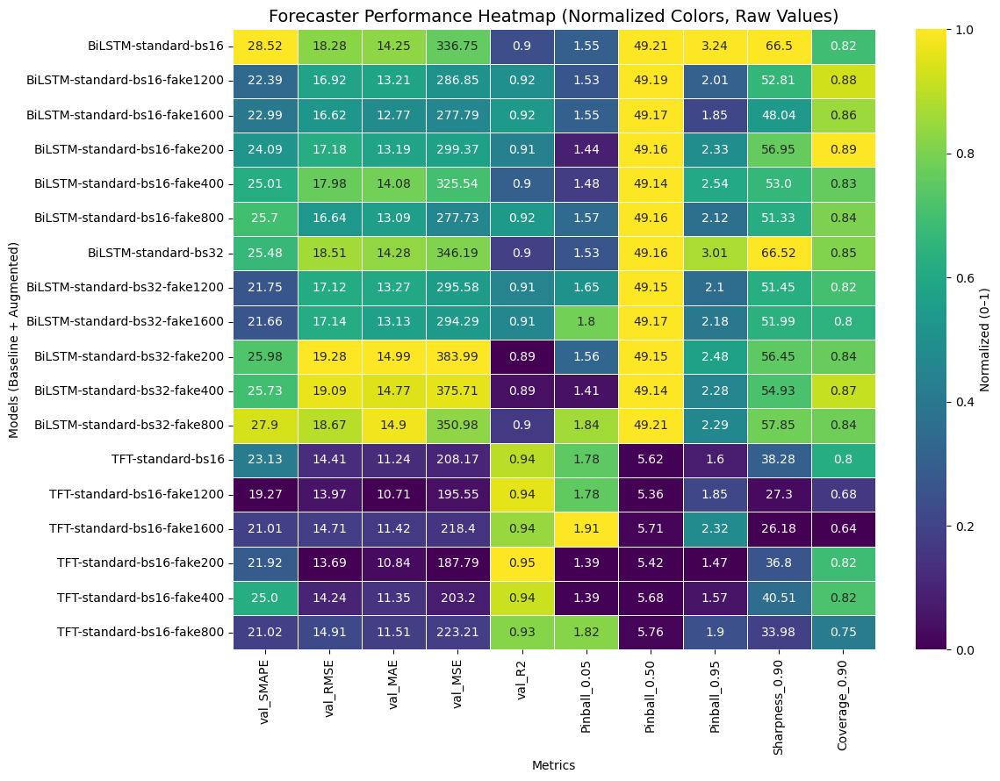

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Identify base configurations that have augmentation runs
aug_base_configs = df_aug['model_name'] + '-' + df_aug['scaler_name'] + '-bs' + df_aug['batch_size'].astype(str)
aug_base_configs = aug_base_configs.unique()

# Step 2: Create 'config_base' in df_test to filter
df_test['config_base'] = df_test['model_name'] + '-' + df_test['scaler_name'] + '-bs' + df_test['batch_size'].astype(str)
df_test_filtered = df_test[df_test['config_base'].isin(aug_base_configs)]

# Step 3: Align columns before concat
common_cols = df_test_filtered.columns.intersection(df_aug.columns)
df_test_filtered = df_test_filtered[common_cols]
df_aug_filtered = df_aug[common_cols]

# Step 4: Concatenate filtered test + aug
df = pd.concat([df_test_filtered, df_aug_filtered], axis=0, ignore_index=True)

# Step 5: Proceed with your config and heatmap logic as before
df['config_base'] = df['model_name'] + '-' + df['scaler_name'] + '-bs' + df['batch_size'].astype(str)
df['config_full'] = df['config_base']
df.loc[df['data_augmentation'] == True, 'config_full'] = (
    df['config_base'] + '-fake' + df['fake_data_length'].astype(str)
)

# Metrics of interest
metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2','Pinball_0.05', 'Pinball_0.50', 'Pinball_0.95', 'Sharpness_0.90', 'Coverage_0.90']

# Compute mean over seeds per config
heatmap_data = (
    df.groupby('config_full')[metrics]
    .mean()
    .sort_index()
)

# Normalize per column (metric) for color scale
normalized = (heatmap_data - heatmap_data.min()) / (heatmap_data.max() - heatmap_data.min())

# Plot heatmap
plt.figure(figsize=(12, len(heatmap_data) * 0.5))
sns.heatmap(
    normalized,
    annot=heatmap_data.round(2),
    fmt='',
    cmap='viridis',
    linewidths=0.5,
    cbar_kws={'label': 'Normalized (0–1)'}
)

plt.title("Forecaster Performance Heatmap (Normalized Colors, Raw Values)", fontsize=14)
plt.xlabel("Metrics")
plt.ylabel("Models (Baseline + Augmented)")
plt.tight_layout()
plt.savefig(f"Plots/heatmap_pinball_augmentation.png")


### Boxplots of the forecasters

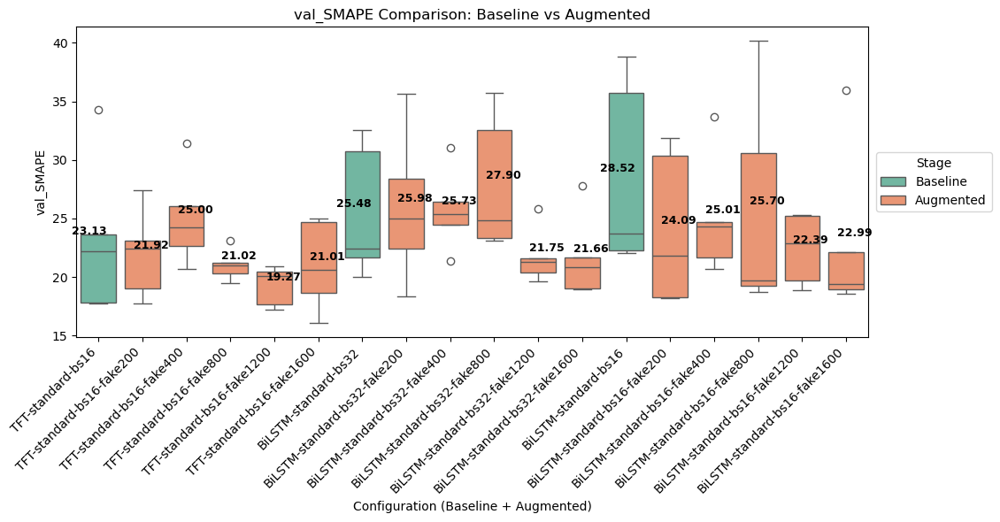

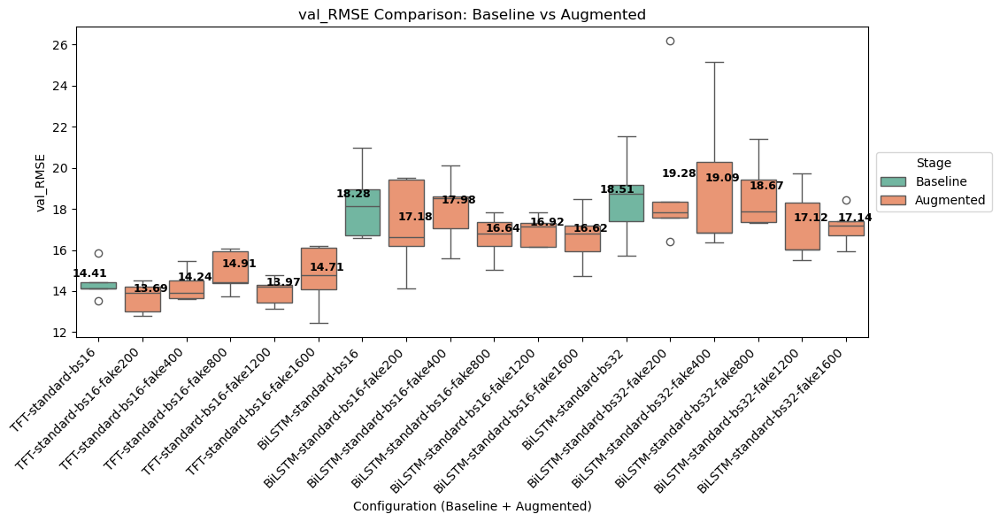

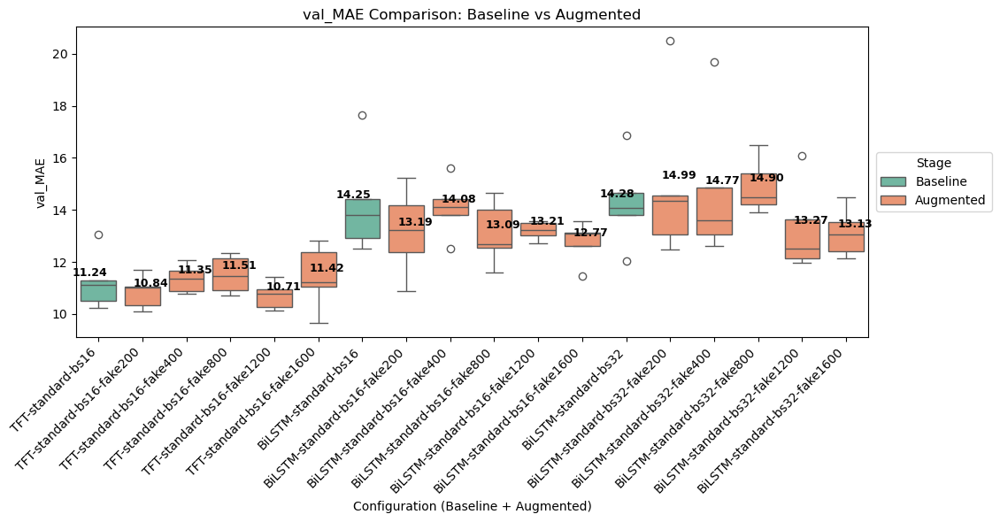

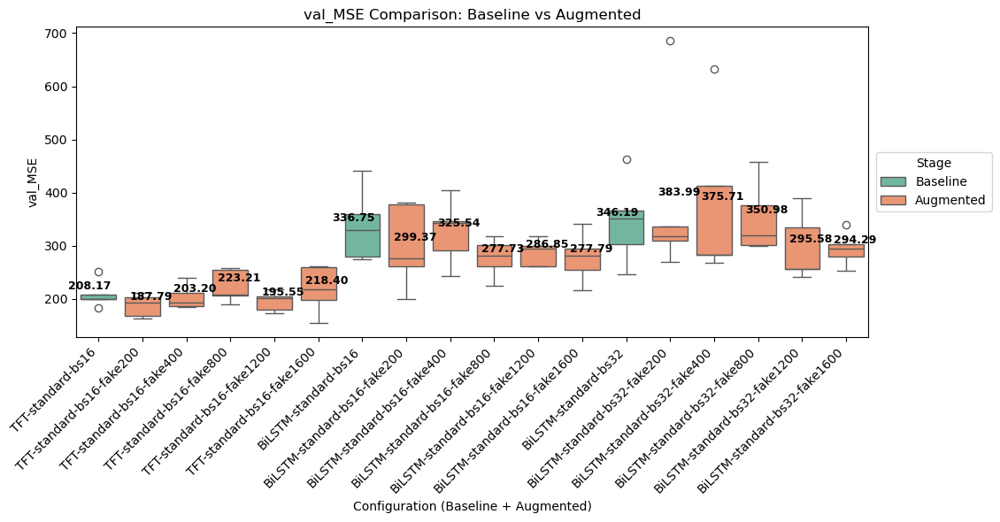

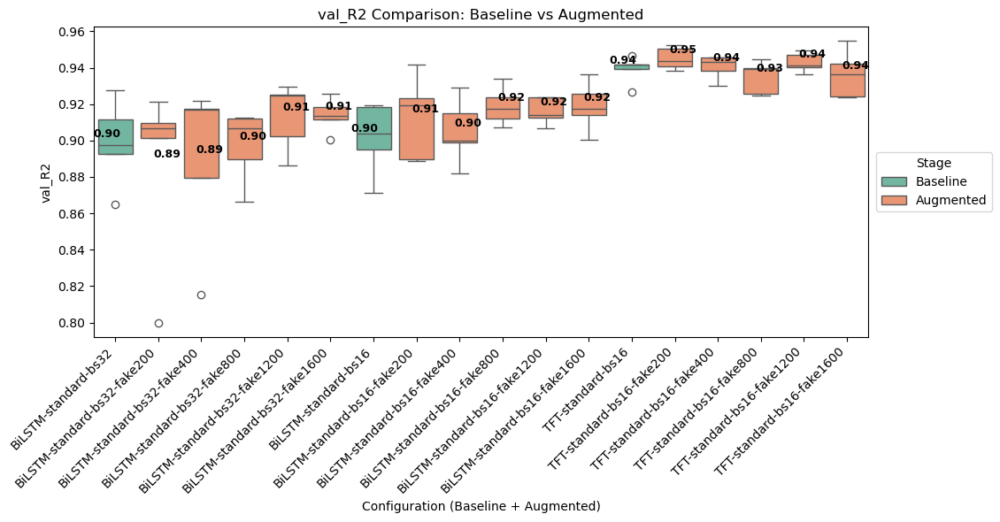

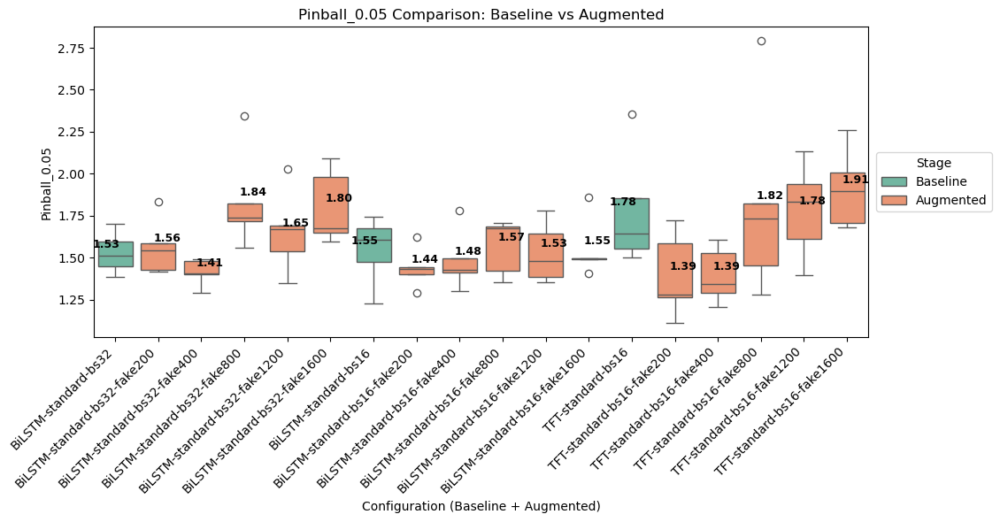

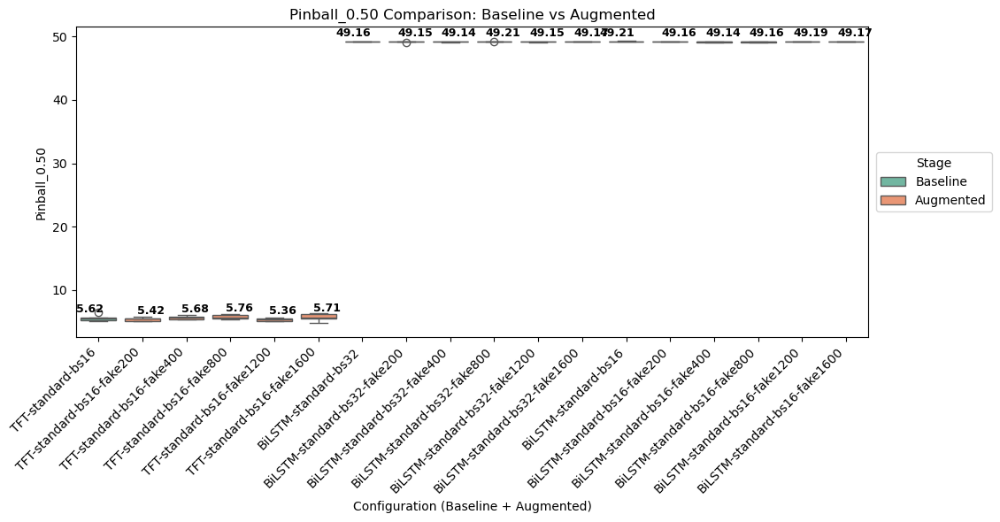

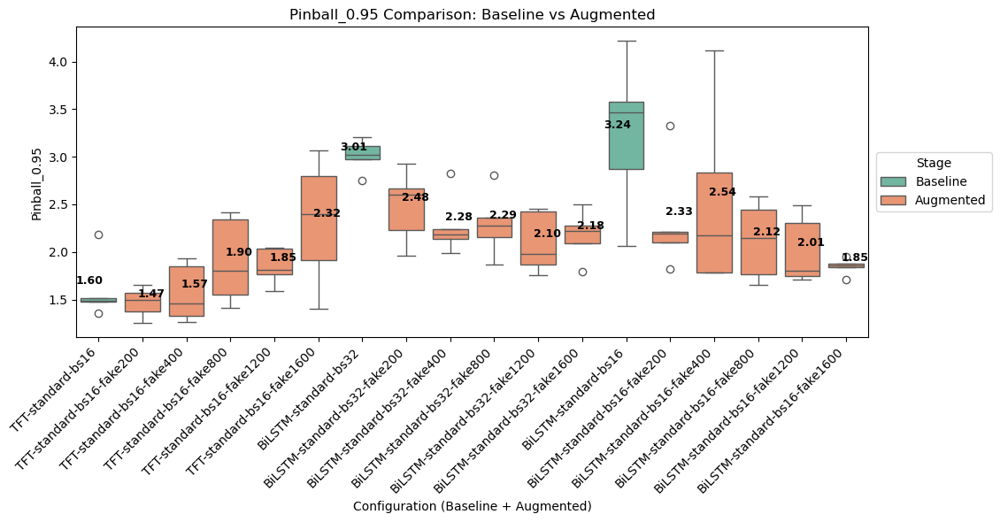

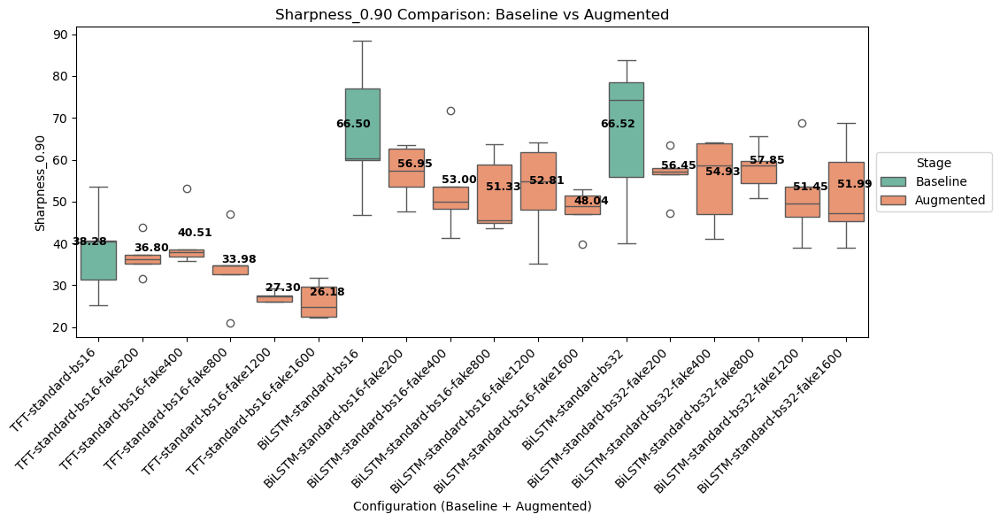

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_augmented_vs_baseline_boxplots(metric, df):
    # Create config_name: includes fake_data_length for augmented runs
    base = df['model_name'] + '-' + df['scaler_name'] + '-bs' + df['batch_size'].astype(str)
    augmented = df['data_augmentation'] & df['fake_data_length'].notna()
    df['config_name'] = base.where(~augmented, base + '-fake' + df['fake_data_length'].astype(str))

    # Add a new column: stage = 'Baseline' or 'Augmented'
    df['stage'] = df['data_augmentation'].apply(lambda x: 'Augmented' if x else 'Baseline')

    # Sort configs by baseline metric mean
    baseline_order = (
        df[df['stage'] == 'Baseline']
        .groupby('config_name')[metric]
        .mean()
        .sort_values()
        .index
    )

    # Include both baseline and augmented config names (in correct order)
    all_order = []
    for base_config in baseline_order:
        all_order.append(base_config)
        # Add all augmented variants of this config, sorted by fake_data_length
        variants = df[df['config_name'].str.startswith(base_config + '-fake')]['config_name'].unique()
        all_order.extend(sorted(variants, key=lambda x: int(x.split('fake')[-1])))

    # Plot
    plt.figure(figsize=(max(12, len(all_order) * 0.6), 6))
    ax = sns.boxplot(
        data=df[df['config_name'].isin(all_order)],
        x='config_name',
        y=metric,
        hue='stage',
        order=all_order,
        palette='Set2'
    )

    # Annotate mean values
    grouped = df.groupby(['config_name', 'stage'])[metric].mean()
    offsets = {'Baseline': -0.2, 'Augmented': 0.2}
    for i, config in enumerate(all_order):
        for stage in ['Baseline', 'Augmented']:
            if (config, stage) in grouped:
                mean_val = grouped[(config, stage)]
                ax.text(
                    i + offsets[stage],
                    mean_val + 0.01 * (df[metric].max() - df[metric].min()),
                    f"{mean_val:.2f}",
                    ha='center', va='bottom', fontsize=9,
                    color='black', fontweight='bold'
                )

    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Configuration (Baseline + Augmented)")
    plt.ylabel(metric)
    plt.title(f"{metric} Comparison: Baseline vs Augmented")
    plt.legend(
        title="Stage",
        loc='center left',
        bbox_to_anchor=(1.01, 0.5),  # pushes it fully outside to the right
        borderaxespad=0.
    )
    plt.tight_layout(rect=[0, 0, 0.95, 1])  # leave room for legend on the right
    plt.savefig(f"Plots/boxplot_{metric}_pinball_augmentation.png")

df_combined = pd.concat([df_test, df_aug], axis=0, ignore_index=True)
metrics = ['val_SMAPE', 'val_RMSE', 'val_MAE', 'val_MSE', 'val_R2', 'Pinball_0.05', 'Pinball_0.50', 'Pinball_0.95', 'Sharpness_0.90']
for metric in metrics:
    plot_augmented_vs_baseline_boxplots(metric, df)